<h1 style="color:red">Part 1: Data preprocessing</h1>

<h2 style="color: green">Diagnosing data </h2>

This section involves the diagnostic examination and analysis of data to identify any potential issues, errors, or anomalies that could impact the data accuracy and reliability.

Our dataset is about cars information scraped form the Wandaloo site. It contains the following columns:
- `Brand`: The name of the vehicle manufacturer
- `Model`: The specific type or design of vehicle within the brand
- `Version`: The specific variation or edition of a vehicle model
- `Price`: The vehicule's cost
- `Model year`:The year in which the model was released to the market for sale
- `Hand`: The number of previous owners a vehicle has had.
- `Mileage`: how far the vehicle has traveled over its lifetime.
- `Fuel type`: The fuel that powers the engine to produce the necessary energy for the propulsion of the vehicle.
- `Transmision`: It specifies if the vehicule is manual or automatic.
- `Fiscal horsepower`: The measure of the administrative power of a vehicle used in some countries to determine the amount of tax to be paid on the vehicle.
- `Exterior color`
- `Vehicule condition`: The current physical state of the vehicle, including its overall appearance and mechanical condition. 
- `Air conditionning`: The type of the air conditionning in the vehicule.
- `Electric windows`: Refers to electric windows that can be controlled with buttons.
- `Electric seats`: Refers to electric seats.
- `On-board computer`:The computerized system in a vehicle
- `Start & Stop`: The technology of turning off the engine when the vehicle is stationary and then restarting it when the driver is ready to move again.
- `Cruise control`: The feature in a vehicle that allows the driver to set and maintain a steady speed.
- `Automatic headlights`: The feature in a vehicle that allows the headlights to turn on and off automatically based on external lighting conditions.
- `Rain sensor`: The device that is installed on a vehicle's windshield and is designed to automatically activate the windshield wipers when it detects rain or moisture.
- `Steering wheel controls`: The feature in many modern vehicles that allow the driver to control certain functions of the car without taking their hands off the steering wheel. 
- `Touchscreen display`: The type of electronic visual display
- `Electric mirrors`: The feature in a vehicule that allow the driver to adjust the side mirrors with the push of a button.
- `Automatic trunk opening`: The featurethat allows the trunk to open and close automatically.
- `Hands-free start`: The feature a vehicle that allows the driver to start the engine without physically inserting a key into the ignition.
- `1/3-2/3 folding rear seat`: is a type of rear seat configuration commonly found in vehicles that allows the rear seat to be folded down in a flexible manner.
- `Backup camera`: a safety feature in modern vehicles that helps drivers see what is behind their vehicle when backing up.
- `Bluetooth`
- `Aluminum wheels`: a popular type of wheel used in modern vehicles.
- `Leather steering wheel`: a type of steering wheel that is covered in leather
- `Daytime running lights`: a safety feature found on many modern vehicles that are designed to improve visibility and reduce the risk of accidents during the day.
- `Roof rails`: The long bars that run along the length of the car's roof.
- `Roof`: The type of the roof
- `Airbags`: Safety devices in vehicles designed to inflate rapidly in the event of a collision
- `ABS`: Anti-lock Braking System
- `ESP`: Electronic Stability Program. It is a safety feature in vehicles designed to help drivers maintain control of their car during sudden maneuvers
- `Traction control`: a safety feature in vehicles designed to prevent the wheels from spinning during acceleration on slippery or uneven surfaces
- `Architecture`: The design and layout of the engine's components, including its cylinders, valves, and pistons. 
- `Engine displacement`: The measure of the total volume of all the cylinders in an internal combustion engine. 
- `City fuel consumption`: the amount of fuel that a vehicle uses while driving in city or urban environments with frequent starts and stops
- `Highway fuel consumption`: The amount of fuel that a vehicle uses while driving at high speeds on highways or motorways
- `Maximum speed`: maximun speed of the vehicule
- `Fuel tank volume`: the amount of fuel that a vehicle's fuel tank can hold

In [1]:
#### Import libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sn  #Seaborn is a Python data visualization library based on matplotlib
import missingno as msno # Missing data visualization module for Python

import warnings
#"warnings" module in Python to filter out any warnings that might be raised during the execution of the code
warnings.filterwarnings('ignore')


In [2]:
#### Read the dataset

# Read in the dataset
cars = pd.read_csv('wandaloo_cars.csv')


# Set display option to show all columns and rows
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

# Show the head
cars.head(5)

,Brand,Model,Version,Price,Model year,Hand,Mileage,Fuel type,Transmission,Fiscal horsepower,Exterior color,Vehicle condition,Air conditioning,Electric windows,Electric seats,On-board computer,Start & Stop,Cruise control,Automatic headlights,Rain sensor,Steering wheel controls,Touchscreen display,Electric mirrors,Automatic trunk opening,Hands-free start,1/3-2/3 folding rear seat,Backup camera,Bluetooth,Aluminum wheels,Leather steering wheel,Daytime running lights,Roof rails,Roof,Airbags,ABS,ESP,Traction control,Engine architecture,Engine displacement,City fuel consumption,Highway fuel consumption,Maximum speed,Fuel tank volume
0,MERCEDES,Classe C 2014,220 d,228.000 DH,2014.0,Seconde,144.500 km,Diesel,Automatique,8 cv,Gris foncé,Très bon,auto. Bi-zone,Electrique AV/AR,Conducteur et Passager,oui,oui,oui,oui,oui,oui,non,non,non,oui,oui,oui,oui,oui,oui,oui,non,Rigide,oui,oui,oui,oui,NaN,NaN,NaN,NaN,NaN,NaN
1,MERCEDES,Classe C 2003,220 CDI,79.000 DH,2003.0,Seconde,350.000 km,Diesel,Manuelle,8 cv,Noir,Très bon,auto.,Electrique AV/AR,Tous les passagers,oui,oui,oui,oui,oui,oui,oui,oui,oui,non,non,oui,oui,oui,non,oui,non,Rigide,oui,oui,oui,oui,NaN,NaN,NaN,NaN,NaN,NaN
2,MERCEDES,Classe B 2013,180 d Urban,150.000 DH,2013.0,Seconde,144.000 km,Diesel,Manuelle,8 cv,Noir,Comme neuve,manuelle,Electrique AV/AR,non,oui,non,oui,oui,oui,oui,non,non,non,oui,oui,oui,oui,oui,oui,oui,non,Rigide,oui,oui,oui,oui,NaN,NaN,NaN,NaN,NaN,NaN
3,MERCEDES,Classe E 2006,Autre version,135.000 DH,2006.0,Seconde,248.000 km,Diesel,Automatique,9 cv,Gris clair,Comme neuve,auto. Bi-zone,Electrique AV/AR,Conducteur et Passager,oui,non,oui,oui,oui,oui,non,oui,oui,oui,non,non,oui,oui,non,oui,oui,Rigide,oui,oui,oui,oui,NaN,NaN,NaN,NaN,NaN,NaN
4,MERCEDES,CLA Coupé 2014,220 CDI,240.000 DH,2014.0,Seconde,103.000 km,Diesel,Automatique,9 cv,Blanc cassé,Excellent,auto.,Electrique AV/AR,Conducteur et Passager,oui,oui,oui,oui,oui,oui,non,oui,non,oui,non,oui,oui,oui,non,oui,non,Panoramique,oui,oui,oui,oui,NaN,NaN,NaN,NaN,NaN,NaN


In [3]:
#### Rename the columns for better understanding

# Associate to each column its new name
column_map = {
    'Brand': 'Brand',
    'Model': 'Model',
    'Version': 'Version',
    'Price': 'Price',
    'Modèle': 'Model year',
    'Main': 'Hand',
    'Kilométrage': 'Mileage',
    'Carburant': 'Fuel type',
    'Transmision': 'Transmission',
    'Puissance fiscale': 'Fiscal horsepower', 
    'Couleur extérieure': 'Exterior color',
    'Etat du véhicule': 'Vehicle condition',
    'Climatisation': 'Air conditioning',
    'Vitres électriques': 'Electric windows',
    'Sièges électriques': 'Electric seats',
    'Ordinateur de bord': 'On-board computer',
    'Start & Stop': 'Start & Stop',
    'Régulateur de vitesse': 'Cruise control',
    'Allumage auto. des feux': 'Automatic headlights',
    'Détecteur de pluie': 'Rain sensor',
    'Commandes au volant': 'Steering wheel controls',
    'Ecran tactile': 'Touchscreen display',
    'Rétroviseurs électriques': 'Electric mirrors',
    'Ouverture auto. du coffre': 'Automatic trunk opening',
    'Démarrage mains libres': 'Hands-free start',
    'Banquette arrière rabattable 1/3-2/3': '1/3-2/3 folding rear seat',
    'Caméra de recul': 'Backup camera',
    'Bluetooth': 'Bluetooth',
    'Jantes aluminium': 'Aluminum wheels',
    'Volant cuir': 'Leather steering wheel',
    'Feux de jour': 'Daytime running lights',
    'Barres de toit': 'Roof rails',
    'Toit': 'Roof',
    'Airbags': 'Airbags',
    'ABS': 'ABS',
    'ESP': 'ESP',
    'Antipatinage': 'Traction control',
    'Architecture': 'Engine architecture',
    'Cylindrée': 'Engine displacement',
    'Conso. ville': 'City fuel consumption',
    'Conso. route': 'Highway fuel consumption',
    'Vitesse maxi.': 'Maximum speed',
    'Volume du réservoir': 'Fuel tank volume'
}

# Rename the columns using the map
cars = cars.rename(columns=column_map)

# Write the updated data to the same CSV file
cars.to_csv('wandaloo_cars.csv', index=False)

# Show the changes
cars.head(1)

,Brand,Model,Version,Price,Model year,Hand,Mileage,Fuel type,Transmission,Fiscal horsepower,Exterior color,Vehicle condition,Air conditioning,Electric windows,Electric seats,On-board computer,Start & Stop,Cruise control,Automatic headlights,Rain sensor,Steering wheel controls,Touchscreen display,Electric mirrors,Automatic trunk opening,Hands-free start,1/3-2/3 folding rear seat,Backup camera,Bluetooth,Aluminum wheels,Leather steering wheel,Daytime running lights,Roof rails,Roof,Airbags,ABS,ESP,Traction control,Engine architecture,Engine displacement,City fuel consumption,Highway fuel consumption,Maximum speed,Fuel tank volume
0,MERCEDES,Classe C 2014,220 d,228.000 DH,2014.0,Seconde,144.500 km,Diesel,Automatique,8 cv,Gris foncé,Très bon,auto. Bi-zone,Electrique AV/AR,Conducteur et Passager,oui,oui,oui,oui,oui,oui,non,non,non,oui,oui,oui,oui,oui,oui,oui,non,Rigide,oui,oui,oui,oui,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
# Show the head of the data to visually  identify problems

cars.head(50)

,Brand,Model,Version,Price,Model year,Hand,Mileage,Fuel type,Transmission,Fiscal horsepower,Exterior color,Vehicle condition,Air conditioning,Electric windows,Electric seats,On-board computer,Start & Stop,Cruise control,Automatic headlights,Rain sensor,Steering wheel controls,Touchscreen display,Electric mirrors,Automatic trunk opening,Hands-free start,1/3-2/3 folding rear seat,Backup camera,Bluetooth,Aluminum wheels,Leather steering wheel,Daytime running lights,Roof rails,Roof,Airbags,ABS,ESP,Traction control,Engine architecture,Engine displacement,City fuel consumption,Highway fuel consumption,Maximum speed,Fuel tank volume
0,MERCEDES,Classe C 2014,220 d,228.000 DH,2014.0,Seconde,144.500 km,Diesel,Automatique,8 cv,Gris foncé,Très bon,auto. Bi-zone,Electrique AV/AR,Conducteur et Passager,oui,oui,oui,oui,oui,oui,non,non,non,oui,oui,oui,oui,oui,oui,oui,non,Rigide,oui,oui,oui,oui,NaN,NaN,NaN,NaN,NaN,NaN
1,MERCEDES,Classe C 2003,220 CDI,79.000 DH,2003.0,Seconde,350.000 km,Diesel,Manuelle,8 cv,Noir,Très bon,auto.,Electrique AV/AR,Tous les passagers,oui,oui,oui,oui,oui,oui,oui,oui,oui,non,non,oui,oui,oui,non,oui,non,Rigide,oui,oui,oui,oui,NaN,NaN,NaN,NaN,NaN,NaN
2,MERCEDES,Classe B 2013,180 d Urban,150.000 DH,2013.0,Seconde,144.000 km,Diesel,Manuelle,8 cv,Noir,Comme neuve,manuelle,Electrique AV/AR,non,oui,non,oui,oui,oui,oui,non,non,non,oui,oui,oui,oui,oui,oui,oui,non,Rigide,oui,oui,oui,oui,NaN,NaN,NaN,NaN,NaN,NaN
3,MERCEDES,Classe E 2006,Autre version,135.000 DH,2006.0,Seconde,248.000 km,Diesel,Automatique,9 cv,Gris clair,Comme neuve,auto. Bi-zone,Electrique AV/AR,Conducteur et Passager,oui,non,oui,oui,oui,oui,non,oui,oui,oui,non,non,oui,oui,non,oui,oui,Rigide,oui,oui,oui,oui,NaN,NaN,NaN,NaN,NaN,NaN
4,MERCEDES,CLA Coupé 2014,220 CDI,240.000 DH,2014.0,Seconde,103.000 km,Diesel,Automatique,9 cv,Blanc cassé,Excellent,auto.,Electrique AV/AR,Conducteur et Passager,oui,oui,oui,oui,oui,oui,non,oui,non,oui,non,oui,oui,oui,non,oui,non,Panoramique,oui,oui,oui,oui,NaN,NaN,NaN,NaN,NaN,NaN
5,MERCEDES,Classe E 2010,250 CDI BlueEfficiency Classic,150.000 DH VENDUE,2010.0,Seconde,169.950 km,Diesel,Automatique,9 cv,Gris,Très bon,auto. Bi-zone,Electrique AV/AR,Conducteur,oui,non,oui,oui,oui,oui,non,oui,oui,non,oui,oui,oui,oui,non,oui,non,Rigide,oui,oui,oui,oui,NaN,NaN,NaN,NaN,NaN,NaN
6,MERCEDES,Classe E 2016,220 d DCT Luxury,580.000 DH,2016.0,Seconde,18.000 km,Diesel,Automatique,8 cv,Noir,Comme neuve,auto. Multi-zone,Electrique AV/AR,Tous les passagers,oui,oui,oui,oui,oui,oui,oui,oui,oui,oui,non,oui,oui,non,oui,oui,non,Panoramique ouvrant,oui,oui,oui,oui,NaN,NaN,NaN,NaN,NaN,NaN
7,MERCEDES,Classe C 2013,200 d Avantgarde +,228.000 DH,2013.0,Première,155.000 km,Diesel,Automatique,9 cv,Gris,Comme neuve,auto. Bi-zone,Electrique AV/AR,Conducteur et Passager,oui,oui,oui,oui,oui,oui,oui,oui,oui,oui,oui,oui,oui,oui,oui,oui,non,Rigide,oui,oui,oui,oui,NaN,NaN,NaN,NaN,NaN,NaN
8,MERCEDES,GLA 2017,200 d Urban,290.000 DH VENDUE,2017.0,Première,67.271 km,Diesel,Automatique,9 cv,Noir,Comme neuve,auto.,Electrique AV/AR,non,oui,oui,oui,oui,oui,oui,oui,oui,oui,oui,oui,oui,oui,oui,oui,oui,oui,Rigide,oui,oui,oui,oui,NaN,NaN,NaN,NaN,NaN,NaN
9,MERCEDES,CLA Coupé 2014,200 CDI,240.000 DH,2014.0,Seconde,87.000 km,Diesel,Manuelle,6 cv,Blanc,Très bon,auto.,Electrique AV/AR,non,oui,non,oui,oui,non,oui,non,non,oui,oui,non,oui,oui,oui,non,non,non,Rigide,oui,oui,oui,oui,NaN,NaN,NaN,NaN,NaN,NaN


By visually inspecting the data, we can identify several possible issues:

**Data type problems**:
- **Problem 1**: The `Price` is a string with the 'DH' unit attached to every instance
- **Problem 2**: The `Mileage` is also a string with the 'km' unit attached to every distance
- **Problem 3**: The `Fiscal horsepower` is also a sting with the 'cv' unit attached to every value
- **Problem 4**: The `Model year` is presented as a float whereas it is a date
- **Problem 5**: The `Exterior Color` is presented by a string since it can be presented by a RGB format

**Missing data problems**:

- **Problem 6**: So much missing data in `Engine architecture`, `Engine displacement`, `City fuel consumption`, `Highway fuel consumption`, `Maximum speed`,and`Fuel tank volume` columns
- **Problem 7**: Empty rows
- **Problem 8**: Some colors are not mentioned

**Text/categorical data problems:**

- **Problem 9**: The model year is mentioned in the `model` column and has its own column
- **Problem 10**: For some vehicules, in the `Price` column there is 'VENDUE' which means that the vehicule was sold. We can make this in an other column

In [5]:
# Print data types of columns
cars.dtypes

Brand                         object
Model                         object
Version                       object
Price                         object
Model year                   float64
Hand                          object
Mileage                       object
Fuel type                     object
Transmission                  object
Fiscal horsepower             object
Exterior color                object
Vehicle condition             object
Air conditioning              object
Electric windows              object
Electric seats                object
On-board computer             object
Start & Stop                  object
Cruise control                object
Automatic headlights          object
Rain sensor                   object
Steering wheel controls       object
Touchscreen display           object
Electric mirrors              object
Automatic trunk opening       object
Hands-free start              object
1/3-2/3 folding rear seat     object
Backup camera                 object
B

This confirms our previous observations and shows more data type problems:
- `Price` is an object not a float
- `Model year` is a float not a date
- `Mileage` is an object not a distance
- `Fiscal horepower` is an object whereas fiscal horsepower is represented as an integer value.

- **Problem 11**: `City fuel consumption` and `Highway fuel consumption` are object not floats as they represent the amount of fuel
- **Problem 12**: `Maximum speed` is an object not a float
- **Problem 13**:`Fuel tank volume` is an object not a float since it represents an amount of a liquid

In [6]:
# Print info of dataset
cars.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3129 entries, 0 to 3128
Data columns (total 43 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Brand                      3063 non-null   object 
 1   Model                      3063 non-null   object 
 2   Version                    2180 non-null   object 
 3   Price                      3063 non-null   object 
 4   Model year                 2180 non-null   float64
 5   Hand                       2180 non-null   object 
 6   Mileage                    2180 non-null   object 
 7   Fuel type                  2166 non-null   object 
 8   Transmission               2180 non-null   object 
 9   Fiscal horsepower          3048 non-null   object 
 10  Exterior color             2180 non-null   object 
 11  Vehicle condition          2180 non-null   object 
 12  Air conditioning           3048 non-null   object 
 13  Electric windows           3048 non-null   objec

Showing the data information confirms the following problems:
- Same amount of  missing data in `Engine architecture`, `Engine displacement`, `City fuel consumption`, `Highway fuel consumption`,and`Fuel tank volume` columns. So, they may be related.
- There is missing values in every column and a lot of them have the same number of missings values, what raises the possibility of the existence of empty rows
- **Problem 14**:There are more missings in `Model year` than `Model`, so we can fill some missing for this last.

In [7]:
# Print number of missing values
cars.isna().sum()

Brand                          66
Model                          66
Version                       949
Price                          66
Model year                    949
Hand                          949
Mileage                       949
Fuel type                     963
Transmission                  949
Fiscal horsepower              81
Exterior color                949
Vehicle condition             949
Air conditioning               81
Electric windows               81
Electric seats                101
On-board computer              81
Start & Stop                   81
Cruise control                 81
Automatic headlights           81
Rain sensor                    81
Steering wheel controls        81
Touchscreen display            81
Electric mirrors               81
Automatic trunk opening       949
Hands-free start               81
1/3-2/3 folding rear seat      81
Backup camera                  81
Bluetooth                      81
Aluminum wheels                81
Leather steeri

There are so much missing data, we can deal with this by:
- Removing missing values
- Imputation: filling in the missing values with a value that represents the missing data.
- Treating missing values as a separate category

In [8]:
# Print description of data for all columns
cars.describe(include="all")

,Brand,Model,Version,Price,Model year,Hand,Mileage,Fuel type,Transmission,Fiscal horsepower,Exterior color,Vehicle condition,Air conditioning,Electric windows,Electric seats,On-board computer,Start & Stop,Cruise control,Automatic headlights,Rain sensor,Steering wheel controls,Touchscreen display,Electric mirrors,Automatic trunk opening,Hands-free start,1/3-2/3 folding rear seat,Backup camera,Bluetooth,Aluminum wheels,Leather steering wheel,Daytime running lights,Roof rails,Roof,Airbags,ABS,ESP,Traction control,Engine architecture,Engine displacement,City fuel consumption,Highway fuel consumption,Maximum speed,Fuel tank volume
count,3063,3063,2180,3063,2180.000000,2180,2180,2166,2180,3048,2180,2180,3048,3048,3028,3048,3048,3048,3048,3048,3048,3048,3048,2180,3048,3048,3048,3048,3048,3048,3048,3048,3048,3048,3048,3048,3048,845,845,845,845,868,845
unique,33,1127,733,1111,NaN,2,632,4,2,42,23,6,8,5,5,2,2,2,2,2,2,2,2,2,2,2,2,2,11,2,2,2,4,11,2,2,2,11,69,85,62,98,51
top,VOLKSWAGEN,GLC,Autre version,110.000 DH,NaN,Seconde,200.000 km,Diesel,Manuelle,6 cv,Noir,Excellent,auto. Bi-zone,Electrique AV/AR,non,oui,non,oui,oui,oui,oui,oui,oui,non,non,oui,non,oui,oui,non,oui,non,Rigide,oui,oui,oui,oui,4 cylindres,1.968 cm³,- l/100 km,- l/100 km,250 km/h,50 litre
freq,532,24,374,36,NaN,1126,47,1902,1146,955,617,740,946,1935,2006,2192,1775,2186,1742,1590,2132,1662,2139,1774,1666,1655,1706,2116,1429,1830,1870,2316,2394,1922,2704,2235,2094,549,84,121,121,78,144
mean,NaN,NaN,NaN,NaN,2012.002294,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,5.407446,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,1984.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN,2009.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN,2013.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN,2016.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


There is 1127 models. So, we can anticipate some values since same models are more likely to have similar specifictions.

In [9]:
# Find types of fuel 
cars['Fuel type'].unique()

array(['Diesel', 'Essence', nan, 'Electrique', 'Hybride'], dtype=object)

- There is no problem with this



In [10]:
# Find different colors
cars['Exterior color'].unique()

array(['Gris foncé', 'Noir', 'Gris clair', 'Blanc cassé', 'Gris', 'Blanc',
       'Bleu foncé', '-', 'Autre couleur', 'Bleu', nan, 'Beige',
       'Bleu ciel', 'Marron', 'Bordeau', 'Rouge', "Jaune d'or",
       'Marron clair', 'Orange', 'Violet', 'Vert foncé', 'Vert', 'Jaune',
       'Rose'], dtype=object)

- We can replace all of '-' and 'nan' with 'Autre couleur' since a car has necessary a color



In [11]:
# Find vehicule conditions
cars['Vehicle condition'].unique()

array(['Très bon', 'Comme neuve', 'Excellent', 'Bon', '-', 'Correct', nan],
      dtype=object)

**Problem 15**: Some cars do not have a state. We can create a new category for vehicule condition like 'Not described' for '-' and 'nan'

In [12]:
# Find air conditioning states
cars['Air conditioning'].unique()

array(['auto. Bi-zone', 'auto.', 'manuelle', 'auto. Multi-zone',
       'auto. Tri-zone', 'non', nan, 'تلقاءي.', 'auto. Quadri-zone'],
      dtype=object)

In [13]:
# How many values of different room_types do we have?
cars['Air conditioning'].value_counts()

auto. Bi-zone        946
manuelle             926
auto.                513
non                  409
auto. Tri-zone       141
auto. Multi-zone      59
auto. Quadri-zone     53
تلقاءي.                1
Name: Air conditioning, dtype: int64

**Problem 16**: There is an uncessary cotergory in Air conditioning: 'تلقاءي.' .It can be replace with 'auto.'

In [14]:
# Find electric windows and seats categories
print(cars['Electric windows'].unique())
print(cars['Electric seats'].unique())

['Electrique AV/AR' 'Electrique AV' '-' nan 'Electrique AR' 'non']
['Conducteur et Passager' 'Tous les passagers' 'non' 'Conducteur' nan
 'Passager']


In [15]:
# Find aluminum wheels and airbags categories
print(cars['Aluminum wheels'].unique())
print(cars['Airbags'].unique())

['oui' 'non' nan '17 pouces' '18 pouces' '19 pouces' '20 pouces'
 '16 pouces' '21 pouces' '22 pouces' '15 pouces' '14 pouces']
['oui' 'non' nan '8.0' '6.0' '10.0' '7.0' '0.0' '2.0' '4.0' '9.0' '1.0']


In [16]:
# Find duplicates rows' number 
cars.duplicated().sum()

88

**Problem 17**: There is 88 duplicated row

<h2 style="color: green">Cleaning data </h2>

<h2 style="color: blue">To do list: </h2>

_Dealing with missing data:_

- **Task 1**: Eliminate empty rows
- **Task 2**: Eliminate some rows if possible.
- **Task 3**: Create some new categories for missings if possible
- **Task 4**: Fill some missings if possible

<br>

_Text/categorical data problems:_

- **Task 5**: Replace the category `تلقاءي.` in `Air conditioning ` with `auto.`
- **Task 6**: Drop duplicated rows

<br>

_Dealing with data type problems:_

- **Task 1**: Remove 'DH' or 'DH VENDUE' from `Price` and convert it to `float`and create a column that indicated if a vehicle is sold or not.
- **Task 2**: Remove `km` from `Mileage` and convert it to `float`
- **Task 3**: Convert `Maximum speed` to float
- **Task 4**: Convert `City fuel consumption` and `Highway fuel consumption` to floats
- **Task 5**: Convert `Fuel tank volume` to floats








<h2 style="color: blue">Missing and Text/categorical data problems </h2>

<h3 style="color: purple">Task 6:</h3> Drop duplicated rows

In [17]:
#Number of entries in the data
print(f'There is {cars.shape[0]} entries in our data')

# Number of duplicated rows
print(f'The number of duplicated rows {cars.duplicated().sum()}')

# drop duplicated rows
cars.drop_duplicates(inplace=True)

There is 3129 entries in our data
The number of duplicated rows 88


<h3 style="color: purple">Task 1:</h3> Drop empty rows

In [18]:
# Since there was some empty rows. So, there still an empty row after droping duplicated rows

# Drop index column
cars = cars.reset_index(drop=True)

# Drop the empty column
cars = cars.dropna(subset= cars.columns[:], how="all")


# Create boolean mask for rows with 0 non-NaN values
mask = (cars.notnull().sum(axis=1) == 0)

# Count number of rows with 0 non-NaN values
n_rows_with_0_non_nan = mask.sum()

print(f"The dataset has {n_rows_with_0_non_nan} empty rows ")
print(f'After removing duplicated and empty rows, we have {cars.shape[0]} entries in our data')

The dataset has 0 empty rows 
After removing duplicated and empty rows, we have 3040 entries in our data


<h3 style="color: purple">Task 2:</h3> Eliminate some rows if possible.

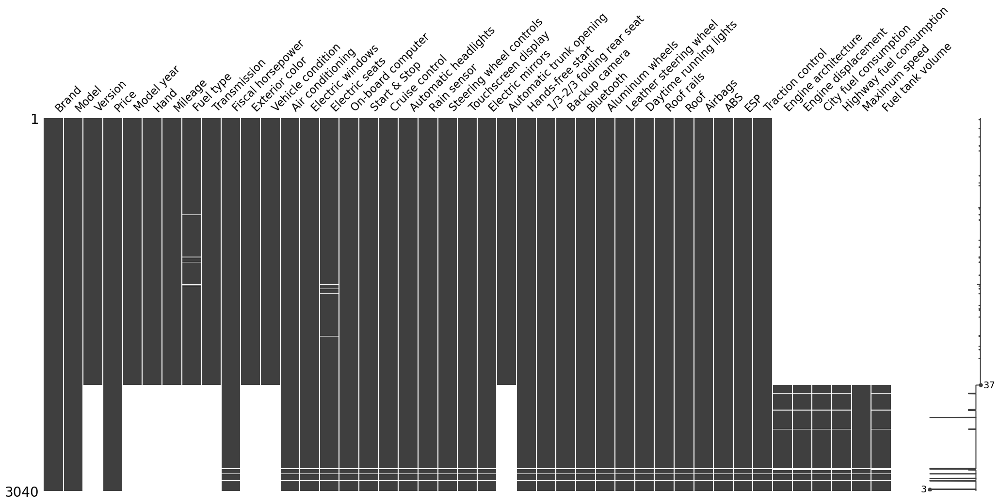

In [19]:
# Visualize the missingness 
msno.matrix(cars)
plt.show()

We show the rows that have missing values for 40 columns

In [20]:
# create a mask for rows with 40 NaN values
mask_empty_rows = cars.isna().sum(axis=1) == 40

# select rows with 40 NaN values using boolean indexing
rows_with_40_nans = cars[mask_empty_rows]

# Show these rows
rows_with_40_nans

,Brand,Model,Version,Price,Model year,Hand,Mileage,Fuel type,Transmission,Fiscal horsepower,Exterior color,Vehicle condition,Air conditioning,Electric windows,Electric seats,On-board computer,Start & Stop,Cruise control,Automatic headlights,Rain sensor,Steering wheel controls,Touchscreen display,Electric mirrors,Automatic trunk opening,Hands-free start,1/3-2/3 folding rear seat,Backup camera,Bluetooth,Aluminum wheels,Leather steering wheel,Daytime running lights,Roof rails,Roof,Airbags,ABS,ESP,Traction control,Engine architecture,Engine displacement,City fuel consumption,Highway fuel consumption,Maximum speed,Fuel tank volume
2440,FIAT,500,NaN,162.900 DH * promo,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2857,PORSCHE,Cayenne,NaN,1.370.000 DH * * Prix public,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2858,PORSCHE,Cayenne,NaN,2.350.000 DH * * Prix public,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2859,PORSCHE,Cayenne,NaN,2.460.000 DH * * Prix public,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2861,PORSCHE,Cayenne Coupé,NaN,1.578.000 DH * * Prix public,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2862,PORSCHE,Cayenne Coupé,NaN,2.620.000 DH * * Prix public,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2900,SEAT,Ibiza,NaN,242.900 DH * promo,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2937,SKODA,Karoq,NaN,369.000 DH * * Prix public,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2954,SUZUKI,Ignis,NaN,126.900 DH * * Prix public,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2955,SUZUKI,Ignis,NaN,139.900 DH * * Prix public,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [21]:
# Look for columns with Brand 'FIAT' and model '500'

# use boolean indexing to select rows
mask = (cars['Brand'] == 'FIAT') & (cars['Model'] == '500')
cars[mask]

,Brand,Model,Version,Price,Model year,Hand,Mileage,Fuel type,Transmission,Fiscal horsepower,Exterior color,Vehicle condition,Air conditioning,Electric windows,Electric seats,On-board computer,Start & Stop,Cruise control,Automatic headlights,Rain sensor,Steering wheel controls,Touchscreen display,Electric mirrors,Automatic trunk opening,Hands-free start,1/3-2/3 folding rear seat,Backup camera,Bluetooth,Aluminum wheels,Leather steering wheel,Daytime running lights,Roof rails,Roof,Airbags,ABS,ESP,Traction control,Engine architecture,Engine displacement,City fuel consumption,Highway fuel consumption,Maximum speed,Fuel tank volume
2438,FIAT,500,NaN,136.900 DH * promo,NaN,NaN,NaN,NaN,NaN,7 cv,NaN,NaN,manuelle,Electrique AV,non,oui,non,non,non,non,oui,non,oui,NaN,non,non,non,non,non,non,oui,non,Rigide,8.0,oui,oui,oui,4 cylindres,1.242 cm³,"6,2 l/100 km","4,2 l/100 km",160 km/h,35 litre
2439,FIAT,500,NaN,153.500 DH * promo,NaN,NaN,NaN,NaN,NaN,7 cv,NaN,NaN,auto.,Electrique AV,non,oui,non,non,non,non,oui,oui,oui,NaN,non,non,non,oui,15 pouces,non,oui,non,Panoramique,8.0,oui,oui,oui,4 cylindres,1.242 cm³,"6,2 l/100 km","4,2 l/100 km",160 km/h,35 litre
2440,FIAT,500,NaN,162.900 DH * promo,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2441,FIAT,500,NaN,162.900 DH * promo,NaN,NaN,NaN,NaN,NaN,7 cv,NaN,NaN,auto.,Electrique AV,non,oui,non,non,non,non,oui,oui,oui,NaN,non,non,non,oui,15 pouces,oui,oui,non,Panoramique,8.0,oui,oui,oui,4 cylindres,1.242 cm³,"6,2 l/100 km","4,2 l/100 km",160 km/h,35 litre


Since, there is other rows with the same model '500' and Brand 'FIAT', we can drop the one that has just the Brand and the Model values.
We check for each row: if there is other rows that have the same brand and model, we drop it

In [22]:
# Look for columns with Brand 'PORSCHE' and model 'Cayenne'

# use boolean indexing to select rows
mask = (cars['Brand'] == 'PORSCHE') & (cars['Model'] == 'Cayenne')
cars[mask]

,Brand,Model,Version,Price,Model year,Hand,Mileage,Fuel type,Transmission,Fiscal horsepower,Exterior color,Vehicle condition,Air conditioning,Electric windows,Electric seats,On-board computer,Start & Stop,Cruise control,Automatic headlights,Rain sensor,Steering wheel controls,Touchscreen display,Electric mirrors,Automatic trunk opening,Hands-free start,1/3-2/3 folding rear seat,Backup camera,Bluetooth,Aluminum wheels,Leather steering wheel,Daytime running lights,Roof rails,Roof,Airbags,ABS,ESP,Traction control,Engine architecture,Engine displacement,City fuel consumption,Highway fuel consumption,Maximum speed,Fuel tank volume
2856,PORSCHE,Cayenne,NaN,961.000 DH * * Prix public,NaN,NaN,NaN,NaN,NaN,21 cv,NaN,NaN,auto. Bi-zone,Electrique AV/AR,Conducteur et Passager,oui,oui,oui,oui,oui,oui,oui,oui,NaN,oui,oui,oui,oui,20 pouces,oui,oui,oui,Panoramique,10.0,oui,oui,oui,6 cylindres en V,2.995 cm³,- l/100 km,- l/100 km,253 km/h,90 litre
2857,PORSCHE,Cayenne,NaN,1.370.000 DH * * Prix public,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2858,PORSCHE,Cayenne,NaN,2.350.000 DH * * Prix public,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2859,PORSCHE,Cayenne,NaN,2.460.000 DH * * Prix public,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [23]:
# Look for columns with Brand 'PORSCHE' and model 'Cayenne Coupé'

# use boolean indexing to select rows
mask = (cars['Brand'] == 'PORSCHE') & (cars['Model'] == 'Cayenne Coupé')
cars[mask]

,Brand,Model,Version,Price,Model year,Hand,Mileage,Fuel type,Transmission,Fiscal horsepower,Exterior color,Vehicle condition,Air conditioning,Electric windows,Electric seats,On-board computer,Start & Stop,Cruise control,Automatic headlights,Rain sensor,Steering wheel controls,Touchscreen display,Electric mirrors,Automatic trunk opening,Hands-free start,1/3-2/3 folding rear seat,Backup camera,Bluetooth,Aluminum wheels,Leather steering wheel,Daytime running lights,Roof rails,Roof,Airbags,ABS,ESP,Traction control,Engine architecture,Engine displacement,City fuel consumption,Highway fuel consumption,Maximum speed,Fuel tank volume
2860,PORSCHE,Cayenne Coupé,NaN,1.260.000 DH * * Prix public,NaN,NaN,NaN,NaN,NaN,21 cv,NaN,NaN,auto. Bi-zone,Electrique AV/AR,Conducteur et Passager,oui,oui,oui,oui,oui,oui,oui,oui,NaN,oui,oui,oui,oui,20 pouces,oui,oui,oui,Panoramique,10.0,oui,oui,oui,6 cylindres en V,2.995 cm³,- l/100 km,- l/100 km,253 km/h,90 litre
2861,PORSCHE,Cayenne Coupé,NaN,1.578.000 DH * * Prix public,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2862,PORSCHE,Cayenne Coupé,NaN,2.620.000 DH * * Prix public,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [24]:
# Look for columns with Brand 'SEAT' and model 'Ibiza'

# use boolean indexing to select rows
mask = (cars['Brand'] == 'SEAT') & (cars['Model'] == 'Ibiza')
cars[mask]

,Brand,Model,Version,Price,Model year,Hand,Mileage,Fuel type,Transmission,Fiscal horsepower,Exterior color,Vehicle condition,Air conditioning,Electric windows,Electric seats,On-board computer,Start & Stop,Cruise control,Automatic headlights,Rain sensor,Steering wheel controls,Touchscreen display,Electric mirrors,Automatic trunk opening,Hands-free start,1/3-2/3 folding rear seat,Backup camera,Bluetooth,Aluminum wheels,Leather steering wheel,Daytime running lights,Roof rails,Roof,Airbags,ABS,ESP,Traction control,Engine architecture,Engine displacement,City fuel consumption,Highway fuel consumption,Maximum speed,Fuel tank volume
2898,SEAT,Ibiza,NaN,192.900 DH * promo,NaN,NaN,NaN,NaN,NaN,6 cv,NaN,NaN,manuelle,Electrique AV/AR,non,oui,non,oui,non,non,oui,oui,oui,NaN,non,oui,non,oui,15 pouces,non,oui,non,Rigide,6.0,oui,oui,oui,4 cylindres,1.598 cm³,"4,4 l/100 km","3,5 l/100 km",182 km/h,40 litre
2899,SEAT,Ibiza,NaN,229.900 DH * promo,NaN,NaN,NaN,NaN,NaN,6 cv,NaN,NaN,auto. Bi-zone,Electrique AV/AR,non,oui,non,oui,oui,oui,oui,oui,oui,NaN,oui,oui,oui,oui,18 pouces,oui,oui,non,Panoramique ouvrant,6.0,oui,oui,oui,4 cylindres,1.598 cm³,"4,4 l/100 km","3,5 l/100 km",182 km/h,40 litre
2900,SEAT,Ibiza,NaN,242.900 DH * promo,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2901,SEAT,Ibiza,NaN,147.900 DH * promo,NaN,NaN,NaN,NaN,NaN,6 cv,NaN,NaN,manuelle,Electrique AV/AR,non,oui,non,oui,non,non,oui,oui,oui,NaN,non,oui,non,oui,15 pouces,non,oui,non,Rigide,6.0,oui,oui,oui,3 cylindres,999 cm³,"6,0 l/100 km","4,3 l/100 km",167 km/h,40 litre
2902,SEAT,Ibiza,NaN,163.900 DH * promo,NaN,NaN,NaN,NaN,NaN,6 cv,NaN,NaN,auto. Bi-zone,Electrique AV/AR,non,oui,non,oui,oui,oui,oui,oui,oui,NaN,non,oui,non,oui,15 pouces,oui,oui,non,Rigide,6.0,oui,oui,oui,3 cylindres,999 cm³,"6,0 l/100 km","4,3 l/100 km",167 km/h,40 litre
2903,SEAT,Ibiza,NaN,164.900 DH * promo,NaN,NaN,NaN,NaN,NaN,6 cv,NaN,NaN,auto. Bi-zone,Electrique AV/AR,non,oui,non,oui,oui,oui,oui,oui,oui,NaN,non,oui,non,oui,15 pouces,oui,oui,non,Rigide,6.0,oui,oui,oui,3 cylindres,999 cm³,"6,0 l/100 km","4,3 l/100 km",167 km/h,40 litre
2904,SEAT,Ibiza,NaN,171.900 DH * promo,NaN,NaN,NaN,NaN,NaN,6 cv,NaN,NaN,auto. Bi-zone,Electrique AV/AR,non,oui,non,oui,oui,oui,oui,oui,oui,NaN,non,oui,oui,oui,15 pouces,oui,oui,non,Panoramique ouvrant,6.0,oui,oui,oui,3 cylindres,999 cm³,"6,0 l/100 km","4,3 l/100 km",167 km/h,40 litre


In [25]:
# Look for columns with Brand 'SKODA' and model 'Karoq'

# use boolean indexing to select rows
mask = (cars['Brand'] == 'SKODA') & (cars['Model'] == 'Karoq')
cars[mask]

,Brand,Model,Version,Price,Model year,Hand,Mileage,Fuel type,Transmission,Fiscal horsepower,Exterior color,Vehicle condition,Air conditioning,Electric windows,Electric seats,On-board computer,Start & Stop,Cruise control,Automatic headlights,Rain sensor,Steering wheel controls,Touchscreen display,Electric mirrors,Automatic trunk opening,Hands-free start,1/3-2/3 folding rear seat,Backup camera,Bluetooth,Aluminum wheels,Leather steering wheel,Daytime running lights,Roof rails,Roof,Airbags,ABS,ESP,Traction control,Engine architecture,Engine displacement,City fuel consumption,Highway fuel consumption,Maximum speed,Fuel tank volume
2934,SKODA,Karoq,NaN,289.000 DH * * Prix public,NaN,NaN,NaN,NaN,NaN,8 cv,NaN,NaN,manuelle,Electrique AV/AR,non,oui,non,oui,non,non,oui,oui,oui,NaN,non,oui,non,oui,17 pouces,oui,oui,oui,Rigide,4.0,oui,oui,oui,4 cylindres,1.968 cm³,"6,5 l/100 km","4,6 l/100 km",188 km/h,55 litre
2935,SKODA,Karoq,NaN,314.000 DH * * Prix public,NaN,NaN,NaN,NaN,NaN,8 cv,NaN,NaN,auto.,Electrique AV/AR,non,oui,non,oui,oui,oui,oui,oui,oui,NaN,oui,oui,oui,oui,17 pouces,oui,oui,oui,Rigide,4.0,oui,oui,oui,4 cylindres,1.968 cm³,"6,5 l/100 km","4,6 l/100 km",188 km/h,55 litre
2936,SKODA,Karoq,NaN,354.000 DH * * Prix public,NaN,NaN,NaN,NaN,NaN,8 cv,NaN,NaN,auto.,Electrique AV/AR,non,oui,non,oui,oui,oui,oui,oui,oui,NaN,oui,oui,oui,oui,18 pouces,oui,oui,oui,Panoramique ouvrant,6.0,oui,oui,oui,4 cylindres,1.968 cm³,"6,5 l/100 km","4,6 l/100 km",188 km/h,55 litre
2937,SKODA,Karoq,NaN,369.000 DH * * Prix public,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [26]:
# Look for columns with Brand 'SUZUKI' and model 'Ignis'

# use boolean indexing to select rows
mask = (cars['Brand'] == 'SUZUKI') & (cars['Model'] == 'Ignis')
cars[mask]

,Brand,Model,Version,Price,Model year,Hand,Mileage,Fuel type,Transmission,Fiscal horsepower,Exterior color,Vehicle condition,Air conditioning,Electric windows,Electric seats,On-board computer,Start & Stop,Cruise control,Automatic headlights,Rain sensor,Steering wheel controls,Touchscreen display,Electric mirrors,Automatic trunk opening,Hands-free start,1/3-2/3 folding rear seat,Backup camera,Bluetooth,Aluminum wheels,Leather steering wheel,Daytime running lights,Roof rails,Roof,Airbags,ABS,ESP,Traction control,Engine architecture,Engine displacement,City fuel consumption,Highway fuel consumption,Maximum speed,Fuel tank volume
2954,SUZUKI,Ignis,NaN,126.900 DH * * Prix public,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2955,SUZUKI,Ignis,NaN,139.900 DH * * Prix public,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2956,SUZUKI,Ignis,NaN,149.900 DH * * Prix public,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [27]:
# Look for columns with Brand 'SUZUKI' and model 'Swift'

# use boolean indexing to select rows
mask = (cars['Brand'] == 'SUZUKI') & (cars['Model'] == 'Swift')
cars[mask]

,Brand,Model,Version,Price,Model year,Hand,Mileage,Fuel type,Transmission,Fiscal horsepower,Exterior color,Vehicle condition,Air conditioning,Electric windows,Electric seats,On-board computer,Start & Stop,Cruise control,Automatic headlights,Rain sensor,Steering wheel controls,Touchscreen display,Electric mirrors,Automatic trunk opening,Hands-free start,1/3-2/3 folding rear seat,Backup camera,Bluetooth,Aluminum wheels,Leather steering wheel,Daytime running lights,Roof rails,Roof,Airbags,ABS,ESP,Traction control,Engine architecture,Engine displacement,City fuel consumption,Highway fuel consumption,Maximum speed,Fuel tank volume
2957,SUZUKI,Swift,NaN,119.900 DH * * Prix public,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2958,SUZUKI,Swift,NaN,134.900 DH * * Prix public,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2959,SUZUKI,Swift,NaN,149.900 DH * * Prix public,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [28]:
# Look for columns with Brand 'VOLVO' and model 'XC40'

# use boolean indexing to select rows
mask = (cars['Brand'] == 'VOLVO') & (cars['Model'] == 'XC40')
cars[mask]

,Brand,Model,Version,Price,Model year,Hand,Mileage,Fuel type,Transmission,Fiscal horsepower,Exterior color,Vehicle condition,Air conditioning,Electric windows,Electric seats,On-board computer,Start & Stop,Cruise control,Automatic headlights,Rain sensor,Steering wheel controls,Touchscreen display,Electric mirrors,Automatic trunk opening,Hands-free start,1/3-2/3 folding rear seat,Backup camera,Bluetooth,Aluminum wheels,Leather steering wheel,Daytime running lights,Roof rails,Roof,Airbags,ABS,ESP,Traction control,Engine architecture,Engine displacement,City fuel consumption,Highway fuel consumption,Maximum speed,Fuel tank volume
3026,VOLVO,XC40,NaN,350.000 DH * * Prix public,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3027,VOLVO,XC40,NaN,410.000 DH * * Prix public,NaN,NaN,NaN,NaN,NaN,8 cv,NaN,NaN,auto.,Electrique AV/AR,Conducteur,oui,oui,oui,oui,oui,oui,oui,oui,NaN,oui,oui,oui,oui,19 pouces,oui,oui,oui,Rigide,7.0,oui,oui,oui,3 cylindres,1.477 cm³,"8,3 l/100 km","5,4 l/100 km",200 km/h,54 litre
3028,VOLVO,XC40,NaN,410.000 DH * * Prix public,NaN,NaN,NaN,NaN,NaN,8 cv,NaN,NaN,auto.,Electrique AV/AR,Conducteur,oui,oui,oui,oui,oui,oui,oui,oui,NaN,oui,oui,oui,oui,18 pouces,oui,oui,oui,Rigide,7.0,oui,oui,oui,3 cylindres,1.477 cm³,"8,3 l/100 km","5,4 l/100 km",200 km/h,54 litre
3029,VOLVO,XC40,NaN,530.000 DH * * Prix public,NaN,NaN,NaN,NaN,NaN,8 cv,NaN,NaN,auto.,Electrique AV/AR,Conducteur,oui,oui,oui,oui,oui,oui,oui,oui,NaN,oui,oui,oui,oui,18 pouces,oui,oui,oui,Rigide,7.0,oui,oui,oui,3 cylindres,1.477 cm³,- l/100 km,- l/100 km,180 km/h,54 litre
3030,VOLVO,XC40,NaN,560.000 DH * * Prix public,NaN,NaN,NaN,NaN,NaN,8 cv,NaN,NaN,auto.,Electrique AV/AR,Conducteur,oui,oui,oui,oui,oui,oui,oui,oui,NaN,oui,oui,oui,oui,19 pouces,oui,oui,oui,Panoramique ouvrant,7.0,oui,oui,oui,3 cylindres,1.477 cm³,- l/100 km,- l/100 km,180 km/h,54 litre
3031,VOLVO,XC40,NaN,560.000 DH * * Prix public,NaN,NaN,NaN,NaN,NaN,8 cv,NaN,NaN,auto.,Electrique AV/AR,Conducteur,oui,oui,oui,oui,oui,oui,oui,oui,NaN,oui,oui,oui,oui,18 pouces,oui,oui,oui,Panoramique ouvrant,7.0,oui,oui,oui,3 cylindres,1.477 cm³,- l/100 km,- l/100 km,180 km/h,54 litre


Since for all the rows with 40 null values, there is a row that has the same brand and model, we drop these rows. We drop also the rows of SUZUKI even that there are no other rows with the same brand (Because, there is just 6 rows of it. So, it is not going to influence our data)

In [29]:
# drop rows with 40 NaN values
cars = cars.drop(mask_empty_rows[mask_empty_rows].index)
print(f'Now, we have {cars.shape[0]} entries')

Now, we have 3025 entries


<h3 style="color: purple">Task 3/4:</h3> 
- Fill some missings if possible
- Create some new categories for missings if possible

<AxesSubplot:>

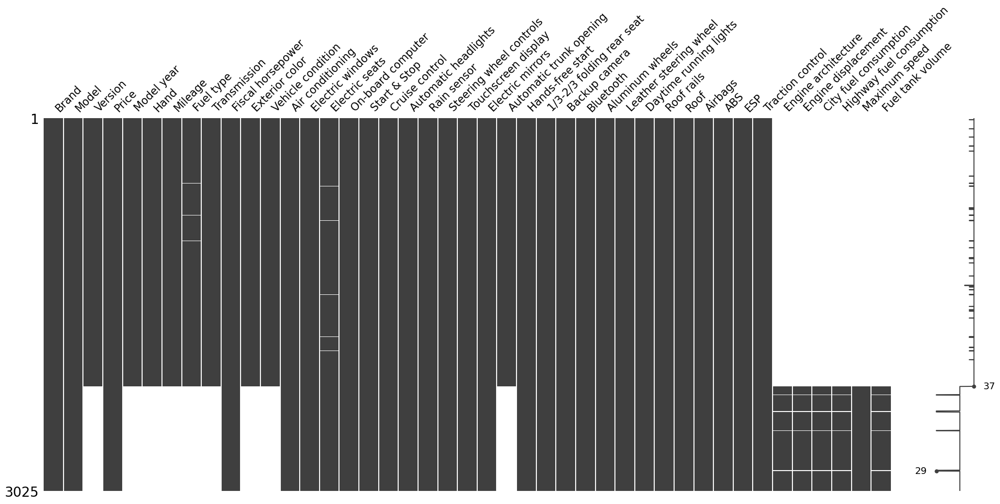

In [30]:
# Show the missings
msno.matrix(cars)

<AxesSubplot:>

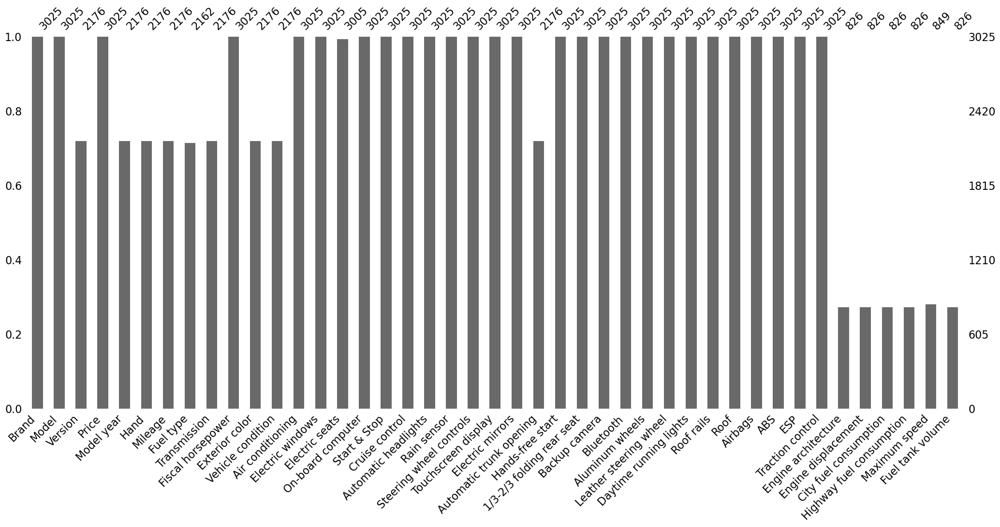

In [31]:
# Show the percentage of completeness in columns
msno.bar(cars)

**Fill the missings of Version column**

In [32]:
# Show  different verisons 
cars['Version'].value_counts()

Autre version                                  372
1.7 CDTi Cosmo                                  32
1.5 dCi Authentique                             27
220 CDI                                         24
1.6 HDi Active                                  16
1.9 dCi Dynamique                               15
1.5 dCi Explore                                 15
1.6 HDi 92 Active                               12
2.0 TDI 150 Confortline                         12
1.5 dCi 85 Intens                               12
1.5 dCi 85 Limited                              12
1.6 TDI Highline                                12
2.0 TDI Confortline                             11
1.9 TDI Confortline                             11
1.5 dCi 110 Smart                               11
2.0 TDI Highline                                11
1.5 dCi 85 Business                             11
1.5 dCi 110 Acenta                              10
1.1 Urban                                       10
1.5 dCi 90 Acenta              

There are some cars where the version is not specified, but it is set to 'Autre version'. So, we can fill the nan values of 'Version' column with 'Autre version' since every car has a version

In [33]:
#Print the number of missings in 'Version' column
version_missings = cars['Version'].isna().sum()
print( f'There are {version_missings} missings in Version column')

# Give to empty 'Version' cells the string 'Autre version'
cars = cars.fillna({'Version':'Autre version'})

# Verify all the missings are filled 
version_missings = cars['Version'].isna().sum()
print(f'There are still {version_missings} missings')

There are 849 missings in Version column
There are still 0 missings


**Fill the missings of Model year column**

In [34]:
# Describe the Model year column
cars['Model year'].describe()

count    2176.000000
mean     2012.005974
std         5.405528
min      1984.000000
25%      2009.000000
50%      2013.000000
75%      2016.000000
max      2022.000000
Name: Model year, dtype: float64

In [35]:
# Fill the missings with the mean value
cars['Model year'] =  cars['Model year'].fillna(2012.0)

# Check the number of missings
cars['Model year'].isna().sum()

0

**Fill the missings of Hand column**

In [36]:
# Create a new category of NaN values
cars['Hand'] = cars['Hand'].fillna('Not specified')

# Show changes
cars['Hand'].isna().sum()

0

**Fill missings in Mileage column**

In [37]:
# Fill the missings with the mean value
cars['Mileage'] = cars['Mileage'].fillna('148.795 km')

# check the Mileage column
cars['Mileage'].isna().sum()

0

**Fill missings in Fuel type column**

In [38]:
# Print the value counts
cars['Fuel type'].value_counts()

Diesel        1898
Essence        256
Hybride          7
Electrique       1
Name: Fuel type, dtype: int64

In [39]:
# Fill the missing with the frequente value
cars['Fuel type']  = cars['Fuel type'].fillna('Not specified')

# Check the missings
cars['Fuel type'].isna().sum()

0

**Fill missings in Transmission column**

In [40]:
# Print the categories of Transmission
cars['Transmission'].value_counts()

Manuelle       1145
Automatique    1031
Name: Transmission, dtype: int64

In [41]:
# Create new category for missing values
cars['Transmission'] = cars['Transmission'].fillna('Not specified')

# Check changes
cars['Transmission'].isna().sum()

0

**Fill the missings in 'Exterior color' column**

In [42]:
# Show the different vehicule's colors 
cars['Exterior color'].value_counts()

Noir             617
Blanc            279
Gris foncé       224
Gris             221
-                217
Gris clair       155
Bleu foncé        87
Autre couleur     67
Marron            50
Bleu              49
Rouge             47
Beige             31
Blanc cassé       24
Bleu ciel         23
Bordeau           21
Marron clair      17
Vert foncé        13
Jaune d'or        10
Violet             9
Vert               9
Orange             2
Jaune              2
Rose               2
Name: Exterior color, dtype: int64

We have a 'Autre couleur' category. So, we can join the missings to this cotegory since every vehicule has a color

In [43]:
# Fill the missings with 'Autre couleur'
cars['Exterior color']  = cars['Exterior color'].fillna('Autre couleur')

# Replace the '-' category with 'Autre couleur'
cars['Exterior color'] = cars['Exterior color'].replace('-','Autre couleur')

# Check the missings
cars['Exterior color'].isna().sum()

0

**Fill missings in Vehicule condition column**

In [44]:
cars['Vehicle condition'].value_counts()

Excellent      738
Très bon       549
Comme neuve    519
-              219
Bon            132
Correct         19
Name: Vehicle condition, dtype: int64

As we can say above, there is a category of '-' which means that the vehicle is not described. So, we can replace it with the NaN values with a new cotergory 'Not described'

In [45]:
# Fill the missings
cars['Vehicle condition'] = cars['Vehicle condition'].fillna('Not described')

# Change the '-' category
cars['Vehicle condition'] =cars['Vehicle condition'].replace('-', 'Not described')

# Check the changes
cars['Vehicle condition'].value_counts()

Not described    1068
Excellent         738
Très bon          549
Comme neuve       519
Bon               132
Correct            19
Name: Vehicle condition, dtype: int64

'Not described' category has 1068 entries; what was '-' and NaN

**Fill missings in 'Automatic trunk opening' column**

In [46]:
# Create new category 'Not specified' for missing values 
cars['Automatic trunk opening'] = cars['Automatic trunk opening'].fillna('Not specified')

#Check changes
cars['Automatic trunk opening'].isna().sum()

0

**Fill missings in 'Engine architecture' column**

In [47]:
# Create new category for missing values
cars['Engine architecture'] = cars['Engine architecture'].fillna('Not specified')

# Check changes
cars['Engine architecture'].isna().sum()

0

**Fill missings in 'Engine displacement' column**

In [48]:
# Fill the missings with the mean value (this value is found in the data type problems)
cars['Engine displacement'] = cars['Engine displacement'].fillna('2007.43 cm³')

# check the Mileage column
cars['Engine displacement'].isna().sum()

0

**Fill missings in 'City fuel consumption' column**

In [49]:
# Fill the missings with the mean value (this value is found in the data type problems)
cars['City fuel consumption'] = cars['City fuel consumption'].fillna('6,6 l/100 km')

# check the Mileage column
cars['City fuel consumption'].isna().sum()

0

**Fill missings in 'Highway fuel consumption' column**

In [50]:
# Fill the missings with the mean value (this value is found in the data type problems)
cars['Highway fuel consumption'] = cars['Highway fuel consumption'].fillna('4,88 l/100 km')

# check the Mileage column
cars['Highway fuel consumption'].isna().sum()

0

**Fill missings in 'Maximun speed' column**

In [51]:
# Fill the missings with the mean value (this value is found in the data type problems)
cars['Maximum speed'] = cars['Maximum speed'].fillna('209 km/h')

# check the Mileage column
cars['Maximum speed'].isna().sum()

0

**Fill missings in 'Fuel tank volume' column**

In [52]:
# Fill the missings with the mean value (this value is found in the data type problems)
cars['Fuel tank volume'] = cars['Fuel tank volume'].fillna('58 litre')

# check the Mileage column
cars['Fuel tank volume'].isna().sum()

0

**Verify if there are still any missing values.**

<AxesSubplot:>

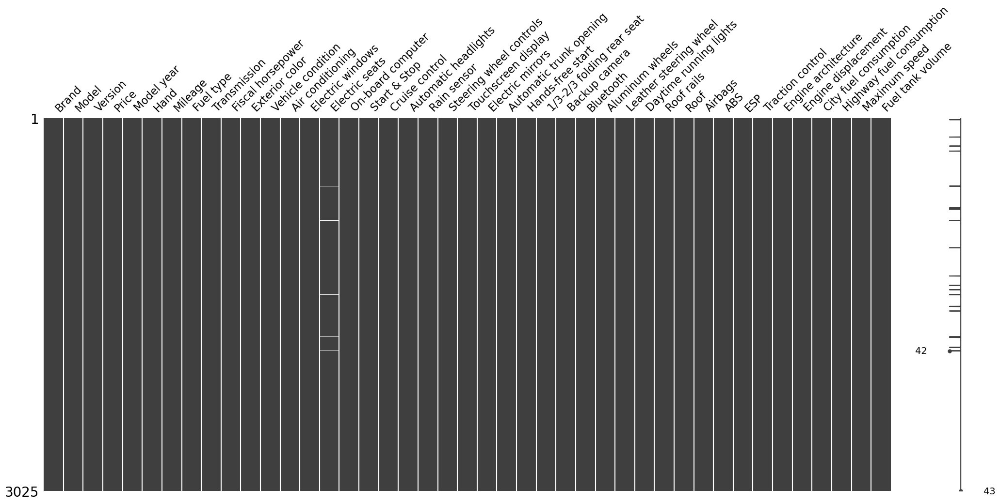

In [53]:
# Show missings matrix
msno.matrix(cars)

So, we have filled all the missing values, except for those in the Electric seats column that we still need to address.

**Fill missings in Electric seats column**

In [54]:
# Count missings
cars['Electric seats'].isna().sum()

20

In [55]:
# Print categories
cars['Electric seats'].value_counts()

non                       1993
Conducteur et Passager     584
Conducteur                 340
Tous les passagers          76
Passager                    12
Name: Electric seats, dtype: int64

In [56]:
#Show the corresponding values of other cloumns to missings in Electric seats column
cars[cars['Electric seats'].isna()]

,Brand,Model,Version,Price,Model year,Hand,Mileage,Fuel type,Transmission,Fiscal horsepower,Exterior color,Vehicle condition,Air conditioning,Electric windows,Electric seats,On-board computer,Start & Stop,Cruise control,Automatic headlights,Rain sensor,Steering wheel controls,Touchscreen display,Electric mirrors,Automatic trunk opening,Hands-free start,1/3-2/3 folding rear seat,Backup camera,Bluetooth,Aluminum wheels,Leather steering wheel,Daytime running lights,Roof rails,Roof,Airbags,ABS,ESP,Traction control,Engine architecture,Engine displacement,City fuel consumption,Highway fuel consumption,Maximum speed,Fuel tank volume
12,MERCEDES,CLS Coupé 2013,63 AMG,290.000 DH VENDUE,2013.0,Seconde,97.911 km,Diesel,Automatique,9 cv,Noir,Excellent,auto. Bi-zone,Electrique AV/AR,NaN,oui,non,oui,oui,oui,oui,oui,oui,oui,non,oui,oui,oui,oui,non,oui,non,Rigide,oui,oui,oui,oui,Not specified,2007.43 cm³,"6,6 l/100 km","4,88 l/100 km",209 km/h,58 litre
154,MERCEDES,190 2013,Autre version,230.000 DH VENDUE,2013.0,Première,120.000 km,Diesel,Automatique,7 cv,Noir,Comme neuve,auto. Multi-zone,Electrique AV/AR,NaN,oui,oui,oui,oui,oui,oui,oui,oui,oui,oui,oui,oui,oui,oui,non,oui,oui,Panoramique ouvrant,oui,oui,oui,oui,Not specified,2007.43 cm³,"6,6 l/100 km","4,88 l/100 km",209 km/h,58 litre
227,NISSAN,Qashqai 2017,1.5 dCi 110 Visia,180.000 DH,2017.0,Première,100.000 km,Diesel,Automatique,6 cv,Noir,Très bon,manuelle,Electrique AV/AR,NaN,oui,oui,oui,non,oui,oui,oui,oui,non,non,non,non,oui,non,non,oui,oui,Rigide,oui,oui,oui,oui,Not specified,2007.43 cm³,"6,6 l/100 km","4,88 l/100 km",209 km/h,58 litre
268,NISSAN,Juke 2014,1.0 DIG-T 117 Tekna,130.000 DH,2014.0,Première,70.000 km,Diesel,Manuelle,6 cv,Rouge,Excellent,auto.,Electrique AV/AR,NaN,oui,oui,oui,oui,oui,oui,oui,oui,non,oui,oui,oui,oui,oui,oui,oui,non,Rigide,oui,oui,oui,oui,Not specified,2007.43 cm³,"6,6 l/100 km","4,88 l/100 km",209 km/h,58 litre
552,PEUGEOT,308 2015,2.0 Blue HDi STT Feline,160.000 DH,2015.0,Première,177.000 km,Diesel,Automatique,8 cv,Autre couleur,Not described,non,-,NaN,oui,non,oui,oui,oui,non,oui,oui,oui,oui,oui,oui,oui,oui,non,oui,oui,Rigide,oui,oui,oui,oui,Not specified,2007.43 cm³,"6,6 l/100 km","4,88 l/100 km",209 km/h,58 litre
728,PEUGEOT,508 2014,Autre version,128.000 DH VENDUE,2014.0,Seconde,153.000 km,Diesel,Automatique,8 cv,Noir,Très bon,auto.,-,NaN,non,non,oui,oui,oui,oui,non,oui,oui,oui,non,non,oui,oui,non,non,non,Rigide,oui,oui,oui,oui,Not specified,2007.43 cm³,"6,6 l/100 km","4,88 l/100 km",209 km/h,58 litre
731,PEUGEOT,508 2012,2.2 HDi GT,165.000 DH VENDUE,2012.0,Seconde,132.000 km,Diesel,Manuelle,9 cv,Autre couleur,Not described,non,-,NaN,oui,oui,oui,oui,oui,oui,oui,oui,oui,oui,oui,oui,oui,oui,non,oui,oui,Rigide,oui,oui,oui,oui,Not specified,2007.43 cm³,"6,6 l/100 km","4,88 l/100 km",209 km/h,58 litre
740,PEUGEOT,208 2013,1.6 HDi Access,92.000 DH VENDUE,2013.0,Première,56.000 km,Diesel,Automatique,-,Gris foncé,Excellent,manuelle,Electrique AV,NaN,oui,non,oui,non,non,oui,non,non,non,non,non,non,non,non,non,non,non,Rigide,oui,oui,oui,non,Not specified,2007.43 cm³,"6,6 l/100 km","4,88 l/100 km",209 km/h,58 litre
831,PORSCHE,Cayenne 2009,3.6 V6,145.000 DH,2009.0,Seconde,167.000 km,Essence,Automatique,21 cv,Autre couleur,Not described,non,-,NaN,oui,non,oui,non,non,oui,oui,oui,oui,oui,non,oui,oui,oui,non,non,non,Rigide,oui,oui,oui,oui,Not specified,2007.43 cm³,"6,6 l/100 km","4,88 l/100 km",209 km/h,58 litre
1052,RENAULT,Mégane 2011,1.9 dCi Dynamique,102.000 DH VENDUE,2011.0,Première,99.000 km,Diesel,Manuelle,6 cv,Beige,Bon,manuelle,Electrique AV,NaN,oui,oui,non,oui,oui,oui,non,oui,non,non,non,non,oui,oui,non,non,non,Rigide,oui,oui,oui,oui,Not specified,2007.43 cm³,"6,6 l/100 km","4,88 l/100 km",209 km/h,58 litre


In [57]:
#Show the corresponding values of other cloumns to missings in Electric seats column
cars[~cars['Electric seats'].isna()]

,Brand,Model,Version,Price,Model year,Hand,Mileage,Fuel type,Transmission,Fiscal horsepower,Exterior color,Vehicle condition,Air conditioning,Electric windows,Electric seats,On-board computer,Start & Stop,Cruise control,Automatic headlights,Rain sensor,Steering wheel controls,Touchscreen display,Electric mirrors,Automatic trunk opening,Hands-free start,1/3-2/3 folding rear seat,Backup camera,Bluetooth,Aluminum wheels,Leather steering wheel,Daytime running lights,Roof rails,Roof,Airbags,ABS,ESP,Traction control,Engine architecture,Engine displacement,City fuel consumption,Highway fuel consumption,Maximum speed,Fuel tank volume
0,MERCEDES,Classe C 2014,220 d,228.000 DH,2014.0,Seconde,144.500 km,Diesel,Automatique,8 cv,Gris foncé,Très bon,auto. Bi-zone,Electrique AV/AR,Conducteur et Passager,oui,oui,oui,oui,oui,oui,non,non,non,oui,oui,oui,oui,oui,oui,oui,non,Rigide,oui,oui,oui,oui,Not specified,2007.43 cm³,"6,6 l/100 km","4,88 l/100 km",209 km/h,58 litre
1,MERCEDES,Classe C 2003,220 CDI,79.000 DH,2003.0,Seconde,350.000 km,Diesel,Manuelle,8 cv,Noir,Très bon,auto.,Electrique AV/AR,Tous les passagers,oui,oui,oui,oui,oui,oui,oui,oui,oui,non,non,oui,oui,oui,non,oui,non,Rigide,oui,oui,oui,oui,Not specified,2007.43 cm³,"6,6 l/100 km","4,88 l/100 km",209 km/h,58 litre
2,MERCEDES,Classe B 2013,180 d Urban,150.000 DH,2013.0,Seconde,144.000 km,Diesel,Manuelle,8 cv,Noir,Comme neuve,manuelle,Electrique AV/AR,non,oui,non,oui,oui,oui,oui,non,non,non,oui,oui,oui,oui,oui,oui,oui,non,Rigide,oui,oui,oui,oui,Not specified,2007.43 cm³,"6,6 l/100 km","4,88 l/100 km",209 km/h,58 litre
3,MERCEDES,Classe E 2006,Autre version,135.000 DH,2006.0,Seconde,248.000 km,Diesel,Automatique,9 cv,Gris clair,Comme neuve,auto. Bi-zone,Electrique AV/AR,Conducteur et Passager,oui,non,oui,oui,oui,oui,non,oui,oui,oui,non,non,oui,oui,non,oui,oui,Rigide,oui,oui,oui,oui,Not specified,2007.43 cm³,"6,6 l/100 km","4,88 l/100 km",209 km/h,58 litre
4,MERCEDES,CLA Coupé 2014,220 CDI,240.000 DH,2014.0,Seconde,103.000 km,Diesel,Automatique,9 cv,Blanc cassé,Excellent,auto.,Electrique AV/AR,Conducteur et Passager,oui,oui,oui,oui,oui,oui,non,oui,non,oui,non,oui,oui,oui,non,oui,non,Panoramique,oui,oui,oui,oui,Not specified,2007.43 cm³,"6,6 l/100 km","4,88 l/100 km",209 km/h,58 litre
5,MERCEDES,Classe E 2010,250 CDI BlueEfficiency Classic,150.000 DH VENDUE,2010.0,Seconde,169.950 km,Diesel,Automatique,9 cv,Gris,Très bon,auto. Bi-zone,Electrique AV/AR,Conducteur,oui,non,oui,oui,oui,oui,non,oui,oui,non,oui,oui,oui,oui,non,oui,non,Rigide,oui,oui,oui,oui,Not specified,2007.43 cm³,"6,6 l/100 km","4,88 l/100 km",209 km/h,58 litre
6,MERCEDES,Classe E 2016,220 d DCT Luxury,580.000 DH,2016.0,Seconde,18.000 km,Diesel,Automatique,8 cv,Noir,Comme neuve,auto. Multi-zone,Electrique AV/AR,Tous les passagers,oui,oui,oui,oui,oui,oui,oui,oui,oui,oui,non,oui,oui,non,oui,oui,non,Panoramique ouvrant,oui,oui,oui,oui,Not specified,2007.43 cm³,"6,6 l/100 km","4,88 l/100 km",209 km/h,58 litre
7,MERCEDES,Classe C 2013,200 d Avantgarde +,228.000 DH,2013.0,Première,155.000 km,Diesel,Automatique,9 cv,Gris,Comme neuve,auto. Bi-zone,Electrique AV/AR,Conducteur et Passager,oui,oui,oui,oui,oui,oui,oui,oui,oui,oui,oui,oui,oui,oui,oui,oui,non,Rigide,oui,oui,oui,oui,Not specified,2007.43 cm³,"6,6 l/100 km","4,88 l/100 km",209 km/h,58 litre
8,MERCEDES,GLA 2017,200 d Urban,290.000 DH VENDUE,2017.0,Première,67.271 km,Diesel,Automatique,9 cv,Noir,Comme neuve,auto.,Electrique AV/AR,non,oui,oui,oui,oui,oui,oui,oui,oui,oui,oui,oui,oui,oui,oui,oui,oui,oui,Rigide,oui,oui,oui,oui,Not specified,2007.43 cm³,"6,6 l/100 km","4,88 l/100 km",209 km/h,58 litre
9,MERCEDES,CLA Coupé 2014,200 CDI,240.000 DH,2014.0,Seconde,87.000 km,Diesel,Manuelle,6 cv,Blanc,Très bon,auto.,Electrique AV/AR,non,oui,non,oui,oui,non,oui,non,non,oui,oui,non,oui,oui,oui,non,non,non,Rigide,oui,oui,oui,oui,Not specified,2007.43 cm³,"6,6 l/100 km","4,88 l/100 km",209 km/h,58 litre


Upon examining these dataframes, it appears that there could be a potential relationship between the "Electric seats" and "Air conditioning" columns. To investigate further, we will display the corresponding categories of `Electric seats` for each category of `Air conditioning`.

In [58]:
# Group the dataframe by column "Air conditioning and count the number of occurrences of each category in column "Electric seats"
cars.groupby('Air conditioning')['Electric seats'].value_counts()


Air conditioning   Electric seats        
auto.              non                       356
                   Conducteur                 81
                   Conducteur et Passager     48
                   Tous les passagers         20
                   Passager                    3
auto. Bi-zone      non                       413
                   Conducteur et Passager    349
                   Conducteur                139
                   Tous les passagers         20
                   Passager                    1
auto. Multi-zone   Conducteur et Passager     26
                   non                        18
                   Tous les passagers         10
                   Conducteur                  4
auto. Quadri-zone  Conducteur et Passager     41
                   Conducteur                  7
                   Tous les passagers          4
                   non                         1
auto. Tri-zone     Conducteur et Passager     66
                   non     

From this result, we fill each missing value in 'Electric seats' with the frequent value that correspond to it 'Air conditioning' category 

In [59]:
# calculate the most frequent value of 'Electric seats' for each group of 'Air conditioning'
most_frequent_value = cars.groupby('Air conditioning')['Electric seats'].transform(lambda x: x.mode()[0])

# fill in the missing values in 'Electric seats' with the corresponding frequent value
cars['Electric seats'].fillna(most_frequent_value, inplace=True)

# Check missings
cars['Electric seats'].isna().sum()

0

<AxesSubplot:>

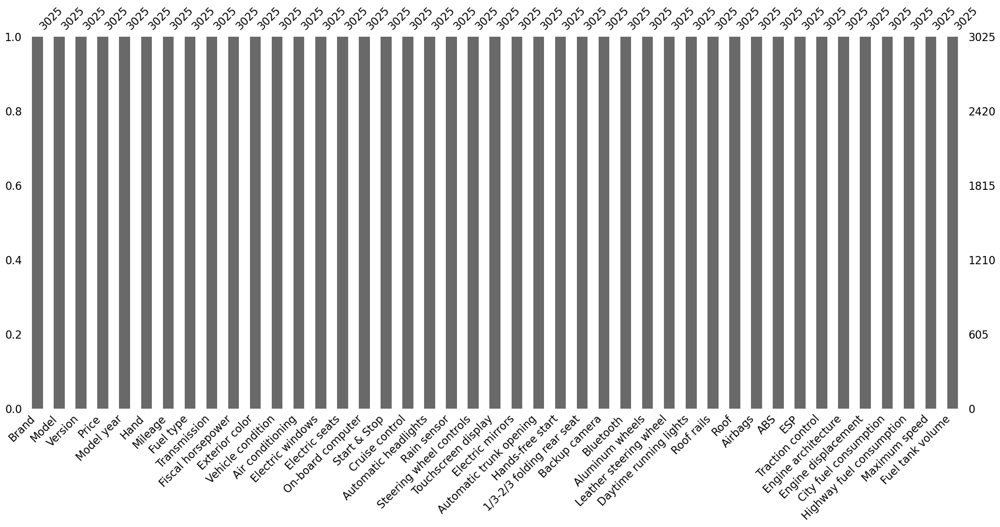

In [60]:
# Check if there is more missings in our dataset
msno.bar(cars)

<h3 style="color: purple">Task 5:</h3> Replace the category `تلقاءي.` in `Air conditioning ` with `auto.`

In [61]:
#Replace `تلقاءي.` with 'auto.'
cars['Air conditioning'] = cars['Air conditioning'].replace('تلقاءي.','auto.')

# Check replacement
cars['Air conditioning'].value_counts()

auto. Bi-zone        929
manuelle             926
auto.                511
non                  406
auto. Tri-zone       141
auto. Multi-zone      59
auto. Quadri-zone     53
Name: Air conditioning, dtype: int64

<h2 style="color: blue">Data type problems </h2>

_Dealing with data type problems:_

- **Task 1**: Remove 'DH' or 'DH VENDUE' from `Price`, convert it to `float`and create a column that indicates if a vehicule is sold or not.
- **Task 2**: Remove `km` from `Mileage` and convert it to `float`
- **Task 3**: Convert `Maximun speed` to float
- **Task 4**: Convert `City fuel consumption` and `Highway fuel consumption` to floats
- **Task 5**: Convert `Fuel tank volume` to floats
- **Task 6**: Convert `Model year` to data type
- **Task 7**: Convert `Fiscal horsepower` to integer
- **Task 8**: Convert `Engine displacement` to float

<h3 style="color: purple">Task 1:</h3> Remove 'DH' or 'DH VENDUE' from Price and convert it to float and create a column that indicated if a vehicule is sold or not.

In [62]:
# Create a column named 'Sold' where we give 'oui' if the car is 'VENDUE' and 'non' if not
cars['Price'] = cars['Price'].astype('str')
cars['Sold'] = cars['Price'].apply(lambda x: 'oui' if len(x.split()) > 2 and x.split()[2] == "VENDUE" else 'non')

# Count of every category
print(cars['Sold'].value_counts())

# Show changes
cars[['Price','Sold']].head()

non    1955
oui    1070
Name: Sold, dtype: int64


,Price,Sold
0,228.000 DH,non
1,79.000 DH,non
2,150.000 DH,non
3,135.000 DH,non
4,240.000 DH,non


In [63]:
# Conserve only the Price in the 'Price' column
cars['Price'] = cars['Price'].str.split().str.get(0)
cars['Price'] = cars['Price'].str.replace('.','')

cars['Price'].head()

0    228000
1     79000
2    150000
3    135000
4    240000
Name: Price, dtype: object

In [64]:
# Convert price to float
cars['Price'] = cars['Price'].astype('float')

# Show changes
cars['Price'].dtypes

dtype('float64')

<h3 style="color: purple">Task 2:</h3>Remove 'km' from 'Mileage' and convert it to float

In [65]:
# Remove 'km' and '.' from Mileage column 
cars['Mileage'] = cars['Mileage'].str.strip('km').str.replace('.','') 

#show changes
cars['Mileage'].head()

0    144500 
1    350000 
2    144000 
3    248000 
4    103000 
Name: Mileage, dtype: object

In [66]:
# Convert 'Mileage' to float
cars['Mileage'] = cars['Mileage'].astype('float')

# Show the new type of 'Mileage' column
cars['Mileage'].dtypes

dtype('float64')

<h3 style="color: purple">Task 3:</h3> Convert `Maximun speed` to float

In [67]:
# Show different speeds we have in our dataset
cars['Maximum speed'].value_counts()

209 km/h    2177
250 km/h      78
180 km/h      46
210 km/h      40
200 km/h      36
230 km/h      35
235 km/h      34
240 km/h      28
190 km/h      23
195 km/h      21
205 km/h      20
175 km/h      19
192 km/h      19
222 km/h      15
186 km/h      15
225 km/h      15
179 km/h      14
220 km/h      14
172 km/h      13
194 km/h      13
207 km/h      13
193 km/h      12
202 km/h      12
160 km/h      12
169 km/h      11
178 km/h      11
170 km/h      11
188 km/h      10
211 km/h       9
245 km/h       9
187 km/h       9
- km/h         9
213 km/h       8
167 km/h       8
155 km/h       7
177 km/h       7
165 km/h       6
182 km/h       6
208 km/h       6
185 km/h       6
216 km/h       6
239 km/h       5
161 km/h       5
164 km/h       5
308 km/h       5
233 km/h       5
224 km/h       5
215 km/h       5
232 km/h       5
199 km/h       5
206 km/h       4
162 km/h       4
184 km/h       4
228 km/h       4
156 km/h       4
173 km/h       4
197 km/h       4
231 km/h       4
244 km/h      

In [68]:
# Delete 'km/h' and '-' from column
cars['Maximum speed'] = cars['Maximum speed'].str.replace('km/h','')

In [69]:
# Convert speed to float
cars['Maximum speed'] = pd.to_numeric(cars['Maximum speed'], errors='coerce')

# Show type 
cars['Maximum speed'].dtypes

dtype('float64')

In [70]:
# Calculate mean speed
mean = cars['Maximum speed'].mean()
print(mean)

# Fill new empty cells with mean value
cars['Maximum speed'] = cars['Maximum speed'].fillna(mean)

208.80152671755727


<h3 style="color: purple">Task 4:</h3>Convert City fuel consumption and Highway fuel consumption to floats

**City fuel consumption**

In [71]:
# Describe 
cars['City fuel consumption'].describe()

count             3025
unique              85
top       6,6 l/100 km
freq              2210
Name: City fuel consumption, dtype: object

In [72]:
# Conserve only the volume

cars['City fuel consumption'] = cars['City fuel consumption'].str.replace(',','.')
cars['City fuel consumption'] = cars['City fuel consumption'].str.replace('l/100','')
cars['City fuel consumption'] = cars['City fuel consumption'].str.replace('km','')

# Convert type to float
cars['City fuel consumption'] = pd.to_numeric(cars['City fuel consumption'], errors='coerce')

# Show type
cars['City fuel consumption'].dtypes

dtype('float64')

In [73]:
# New missings
cars['City fuel consumption'].isna().sum()

118

In [74]:
# Calculate mean
mean = cars['City fuel consumption'].mean()

# Fill new missings
cars['City fuel consumption'] = cars['City fuel consumption'].fillna(mean)

**Highway fuel consumption**

In [75]:
# Show different values of Highway fuel consumption column
cars['Highway fuel consumption'].value_counts()

4,88 l/100 km    2199
- l/100 km        116
3,9 l/100 km       42
4,6 l/100 km       42
4,2 l/100 km       40
4,7 l/100 km       33
3,7 l/100 km       33
4,4 l/100 km       33
4,1 l/100 km       32
4,3 l/100 km       26
3,6 l/100 km       25
4,8 l/100 km       23
4,9 l/100 km       22
3,8 l/100 km       20
5,2 l/100 km       19
5,4 l/100 km       19
3,4 l/100 km       19
4,5 l/100 km       18
4,0 l/100 km       18
6,3 l/100 km       18
5,6 l/100 km       18
5,8 l/100 km       18
5,0 l/100 km       16
5,1 l/100 km       15
5,3 l/100 km       15
3,5 l/100 km       12
5,7 l/100 km       11
6,6 l/100 km        9
5,5 l/100 km        8
8,8 l/100 km        8
6,4 l/100 km        8
3,2 l/100 km        7
6,2 l/100 km        6
3,1 l/100 km        6
3,0 l/100 km        5
5,9 l/100 km        5
6,9 l/100 km        4
10,0 l/100 km       4
7,1 l/100 km        4
6,1 l/100 km        4
7,7 l/100 km        4
2,9 l/100 km        3
9,2 l/100 km        3
8,0 l/100 km        3
6,5 l/100 km        3
3,3 l/100 

In [76]:
# Conserve only the volume

cars['Highway fuel consumption'] = cars['Highway fuel consumption'].str.replace(',','.')
cars['Highway fuel consumption'] = cars['Highway fuel consumption'].str.replace('l/100','')
cars['Highway fuel consumption'] = cars['Highway fuel consumption'].str.replace('km','')

# convert column to numeric data type
cars['Highway fuel consumption'] = pd.to_numeric(cars['Highway fuel consumption'], errors='coerce')

# Show type
cars['City fuel consumption'].dtypes

dtype('float64')

In [77]:
# Is there some missing data?
cars['Highway fuel consumption'].isna().sum()

118

In [78]:
# Fill missings
mean = cars['Highway fuel consumption'].mean()
cars['Highway fuel consumption'] = cars['Highway fuel consumption'].fillna(mean)

# Check missings
cars['Highway fuel consumption'].isna().sum()

0

<h3 style="color: purple">Task 5:</h3>
Convert Fuel tank volume to floats

In [79]:
# Show data
cars['Fuel tank volume'].value_counts()

58 litre     2210
50 litre      144
66 litre       56
60 litre       50
40 litre       45
68 litre       38
55 litre       33
65 litre       29
54 litre       27
57 litre       26
45 litre       25
80 litre       23
43 litre       21
42 litre       19
- litre        19
35 litre       18
85 litre       18
47 litre       18
67 litre       18
59 litre       16
41 litre       16
56 litre       12
100 litre      10
51 litre       10
73 litre       10
44 litre       10
82 litre        9
62 litre        9
46 litre        9
70 litre        8
78 litre        8
36 litre        7
75 litre        6
71 litre        5
53 litre        5
87 litre        4
76 litre        4
63 litre        4
86 litre        3
89 litre        3
74 litre        3
94 litre        2
104 litre       2
61 litre        2
72 litre        2
90 litre        2
52 litre        2
38 litre        2
48 litre        1
37 litre        1
93 litre        1
Name: Fuel tank volume, dtype: int64

In [80]:
# Delete unecessary caracters
cars['Fuel tank volume'] = cars['Fuel tank volume'].str.strip('litre')

# Convert column to integer
cars['Fuel tank volume'] = pd.to_numeric(cars['Fuel tank volume'], errors='coerce')

# Number of missings
cars['Fuel tank volume'].isna().sum()

19

In [81]:
# Calculate mean
mean = cars['Fuel tank volume'].mean()

# Get rid off missings
cars['Fuel tank volume'] = cars['Fuel tank volume'].fillna(mean)

#Check changes
cars['Fuel tank volume'].isna().sum()

0

<h3 style="color: purple">Task 7:</h3> Convert `Fiscal horsepower` to integer

In [82]:
# Show head
cars['Fiscal horsepower'].head()

0    8 cv
1    8 cv
2    8 cv
3    9 cv
4    9 cv
Name: Fiscal horsepower, dtype: object

In [83]:
# Remove the unit 'cv'
cars['Fiscal horsepower'] = cars['Fiscal horsepower'].str.strip('cv')

# Convert to integer
cars['Fiscal horsepower'] = pd.to_numeric(cars['Fiscal horsepower'],errors='coerce')

#Show number of missing values
cars['Fiscal horsepower'].isna().sum()

302

In [84]:
# fill missings with meanq
mean = cars['Fiscal horsepower'].mean()
cars['Fiscal horsepower'] = cars['Fiscal horsepower'].fillna(mean)

# Check missings
cars['Fiscal horsepower'].isna().sum()

0

In [85]:
cars['Fiscal horsepower'].head(12)

0      8.0
1      8.0
2      8.0
3      9.0
4      9.0
5      9.0
6      8.0
7      9.0
8      9.0
9      6.0
10     9.0
11    12.0
Name: Fiscal horsepower, dtype: float64

<h3 style="color: purple">Task 8:</h3>Convert Engine displacement to float

In [86]:
cars['Engine displacement'].head()

0    2007.43 cm³
1    2007.43 cm³
2    2007.43 cm³
3    2007.43 cm³
4    2007.43 cm³
Name: Engine displacement, dtype: object

In [87]:
# Remove "cm³" and "." from Cylindrée
cars['Engine displacement'] = cars['Engine displacement'].str.replace("cm³","")

# Convert Engine displacement to float
cars['Engine displacement'] = cars['Engine displacement'].astype('float')

# Print header and datatypes of Engine displacement column 
print(cars[['Engine displacement']].head())
print (cars['Engine displacement'].dtypes)

   Engine displacement
0              2007.43
1              2007.43
2              2007.43
3              2007.43
4              2007.43
float64


# Checking our cleaned data

<AxesSubplot:>

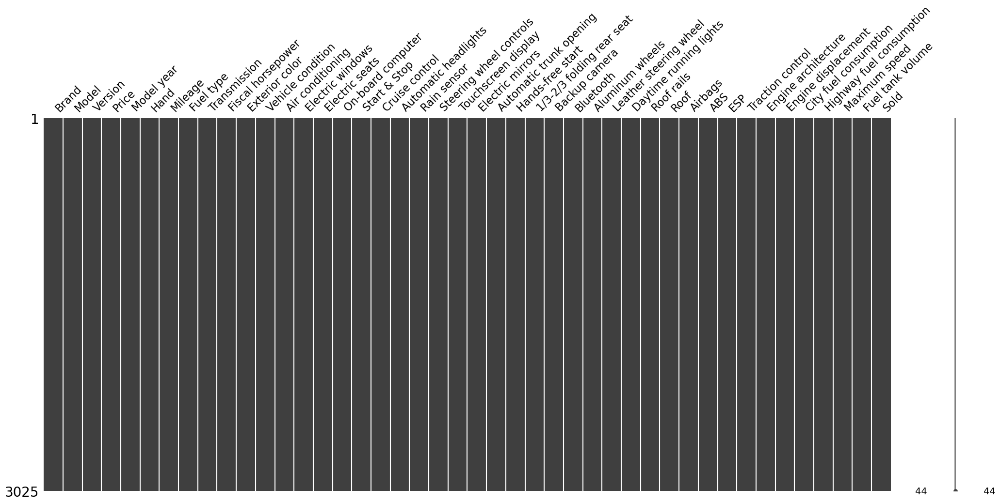

In [88]:
msno.matrix(cars)

There is no missing values

In [89]:
cars.dtypes

Brand                         object
Model                         object
Version                       object
Price                        float64
Model year                   float64
Hand                          object
Mileage                      float64
Fuel type                     object
Transmission                  object
Fiscal horsepower            float64
Exterior color                object
Vehicle condition             object
Air conditioning              object
Electric windows              object
Electric seats                object
On-board computer             object
Start & Stop                  object
Cruise control                object
Automatic headlights          object
Rain sensor                   object
Steering wheel controls       object
Touchscreen display           object
Electric mirrors              object
Automatic trunk opening       object
Hands-free start              object
1/3-2/3 folding rear seat     object
Backup camera                 object
B

All conversions are well done

# Part 2: Data visualization and exploration

In [90]:
from matplotlib import pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

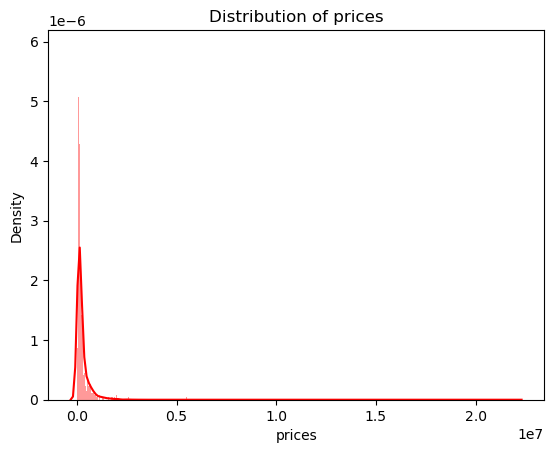

In [91]:
# Visualising the distribution of prices 
sns.distplot(cars['Price'], hist=True, bins= 2500, color='r')
plt.xlabel('prices')
plt.title('Distribution of prices')
plt.show()

In [92]:
# The conversion of the 'Brand' column to the 'category' type to facilitate grouping and counting of the data.
cars.Brand = cars['Brand'].astype('category')

In [93]:
# Conversion of 'Model year' to 'category' 
cars['Model year'] = cars['Model year'].astype('category')
cars.dtypes

Brand                        category
Model                          object
Version                        object
Price                         float64
Model year                   category
Hand                           object
Mileage                       float64
Fuel type                      object
Transmission                   object
Fiscal horsepower             float64
Exterior color                 object
Vehicle condition              object
Air conditioning               object
Electric windows               object
Electric seats                 object
On-board computer              object
Start & Stop                   object
Cruise control                 object
Automatic headlights           object
Rain sensor                    object
Steering wheel controls        object
Touchscreen display            object
Electric mirrors               object
Automatic trunk opening        object
Hands-free start               object
1/3-2/3 folding rear seat      object
Backup camer

In [94]:
# Print mean, max, and min of prices
print('the average price is:           ', cars['Price'].mean())
print('Le prix le plus élevé est:   ', cars['Price'].max())
print('Le prix le plus bas est:     ', cars['Price'].min())

the average price is:            264241.71504132234
Le prix le plus élevé est:    22000000.0
Le prix le plus bas est:      0.0


Text(0, 0.5, 'Nombre de fois')

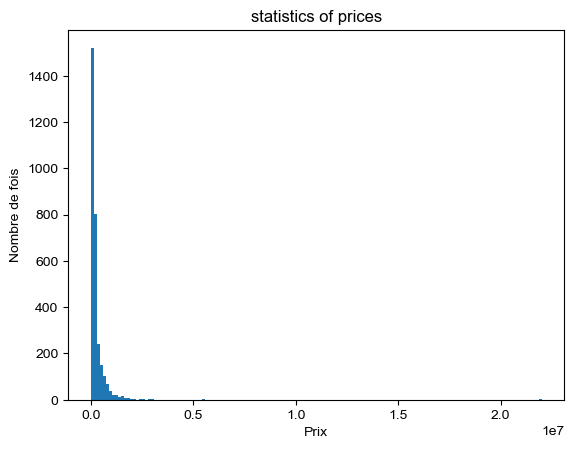

In [95]:
# Create a histogram of the "Price" column in the "cars" DataFrame using matplotlib's plt.hist() function.
# For every price how many cars  
p=plt.hist(cars.Price, bins=150)
sns.set_style ("whitegrid") #adding grid to the graph
plt.title('statistics of prices')
plt.xlabel('Prix')
plt.ylabel('Nombre de fois')

**visualizing the relation between prices and the caracteristics of cars**

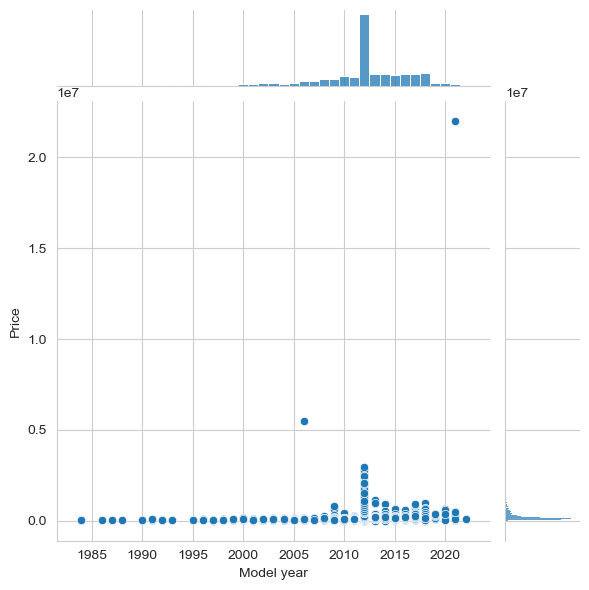

In [96]:
# Display the relationship between 'Price' and 'Model year' by showing 
# their joint distribution and the marginal distributions of each variable.
j1 = sns.jointplot(data=cars, x='Model year', y='Price')

from the beginning to the year 2005 prices are almost fixed, but after the year 2005 have started to increase until reaching their maximum in 2020 

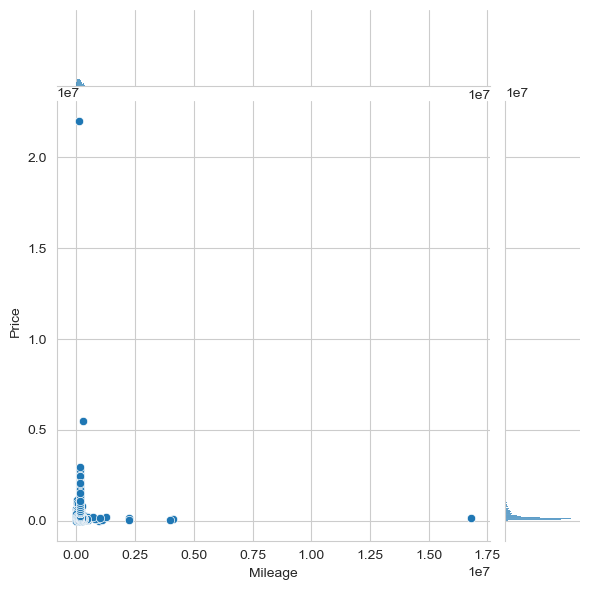

In [97]:
# display the relationship between 'Price' and 'Mileage' 
j2 = sns.jointplot(data=cars, x='Mileage', y='Price')

For cars that have traveled a low number of kilometers, the price is high and it begins to decrease as the number of kilometers traveled decreases.

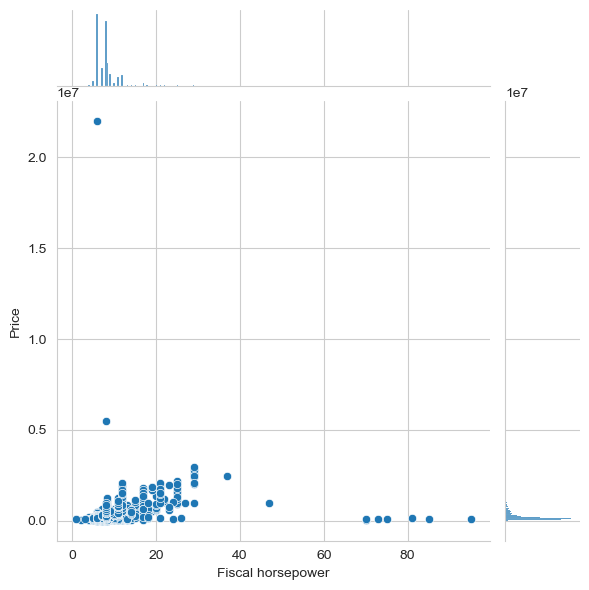

In [98]:
# display the relationship between 'Fiscal horsepower' and 'Price' 
j3 = sns.jointplot(data=cars, x='Fiscal horsepower', y='Price')

If the fiscal horsepower is low, the price of the car is very high and decreases as the fiscal horsepower increases.

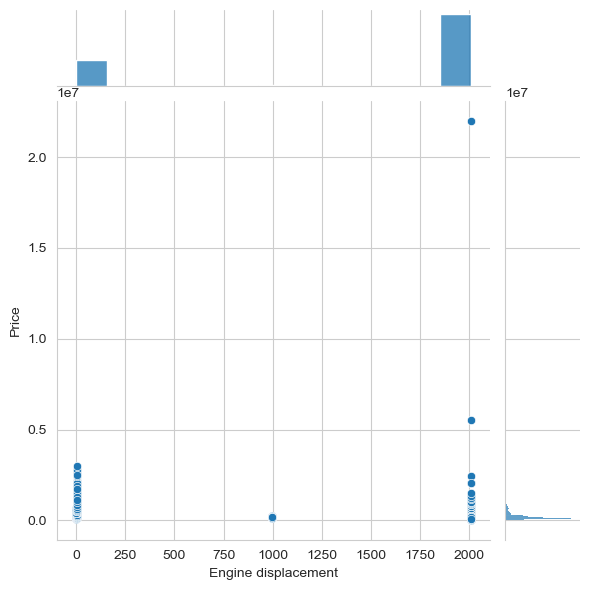

In [99]:
# display the relationship between 'Engine displacement' and 'Price' 
j4 = sns.jointplot(data=cars, x='Engine displacement', y='Price')

If the number of cylinders in the car is low, the price is relatively high and begins to decrease as the number of cylinders increases until it reaches a peak, after which it begins to increase, and the price distribution becomes wide

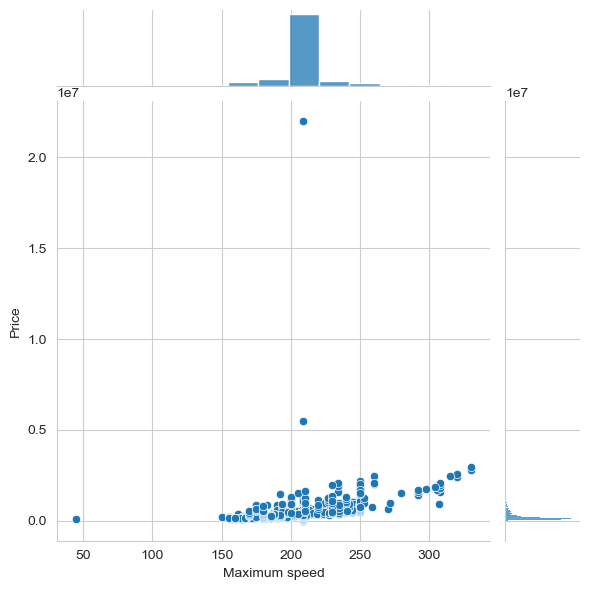

In [100]:
# display the relationship between 'Maximum speed' and 'Price' 
j5 = sns.jointplot(data=cars, x='Maximum speed', y='Price')

The prices of cars increase with an increase in their maximum speed, but the highest price is at the speed of 200, with a large distrubution of prices between the speed 150 and 250

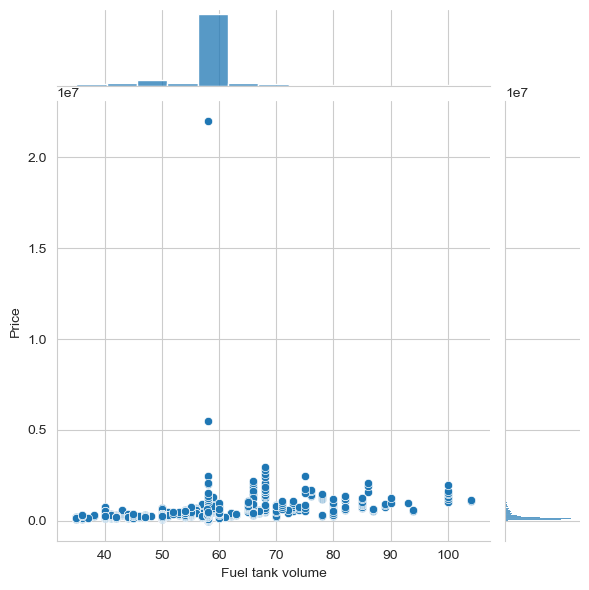

In [101]:
# display the relationship between 'Fuel tank volume' and 'Price' 
j6 = sns.jointplot(data=cars, x='Fuel tank volume', y='Price')

Throughout the increase in the volume of the tank, the price distribution of cars decreases, but with prices higher than those for cars with smaller tank volumes. The price is highest for cars that have a tank volume almost equal to 60 cm³.

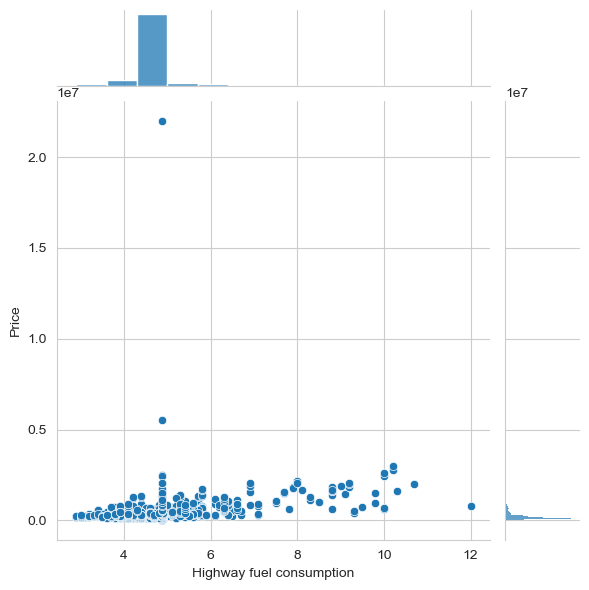

In [102]:
# display the relationship between 'Highway fuel consumption' and 'Price' 
j7 = sns.jointplot(data=cars, x='Highway fuel consumption', y='Price')

For cars that have a high fuel consumption on the road, prices are relatively high but the distribution is low, whereas for cars that have a low fuel consumption on the road, prices are relatively high and the distribution is wide.

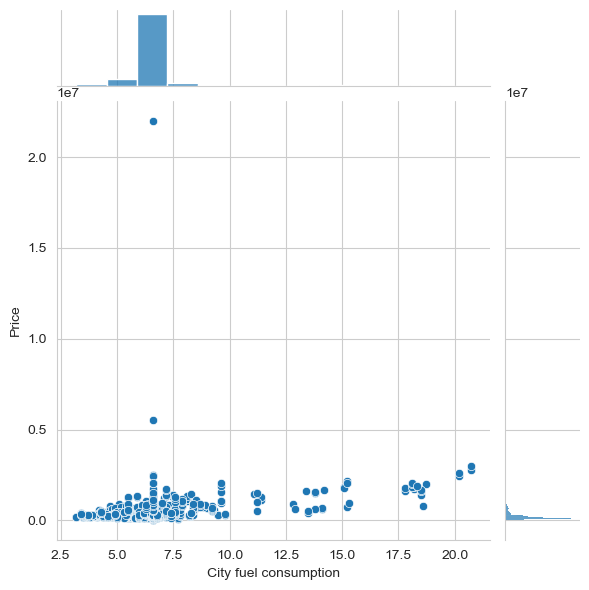

In [103]:
# display the relationship between 'City fuel consumption' and 'Price' 
j8 = sns.jointplot(data=cars, x='City fuel consumption', y='Price')

For cars that have a high fuel consumption in the city, prices are relatively high but the distribution is low, whereas for cars that have a low fuel consumption in the city, prices are relatively high and the distribution is wide.

**LET'S GIT rid of monkey code by using loop**

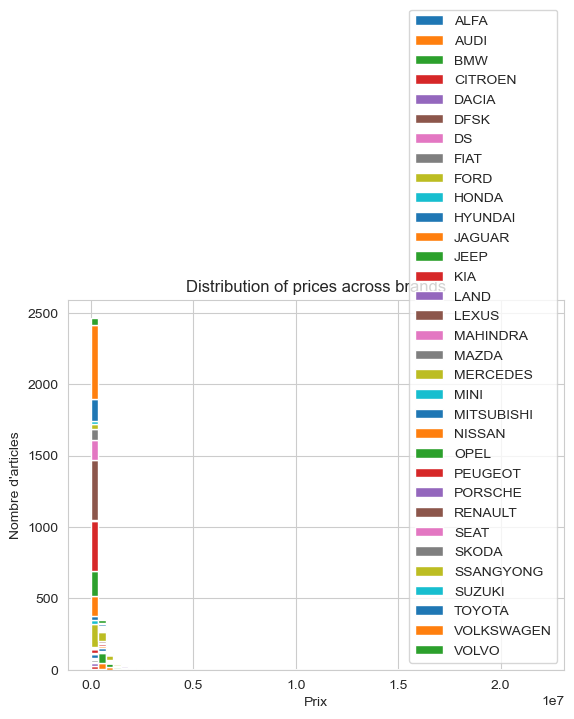

In [104]:
# Extract the unique categories in the "Brand" column of the "cars" DataFrame using the pandas Categorical data type.
brandList = cars.Brand.cat.categories
brandList # list of uniqe genre

# Create a stacked histogram of the car prices for each brand in the "Brand" column
List1 = list()
myLabels= list()
for brand in brandList:
    List1.append(cars.Price[cars.Brand == brand]) # we will add to list new genre each time
    myLabels.append(brand)
h=plt.hist(List1, bins=60, stacked=True, rwidth=1, label = myLabels)

# Visualizing the distribution of car prices across different brands
plt.legend()
plt.title('Distribution of prices across brands')
plt.xlabel('Prix')
plt.ylabel('Nombre d\'articles')
plt.show()

**Visualizing the relation between KDE plot**

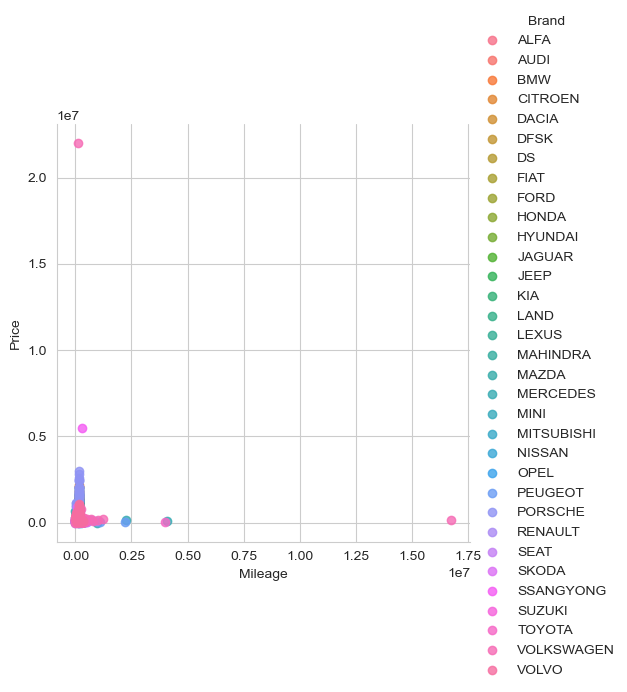

In [105]:
# Create a scatter plot of car prices (Price) versus (Kilométrage) 

vis1= sns.lmplot(data=cars , x="Mileage", y="Price", fit_reg=False, hue="Brand", aspect=1)

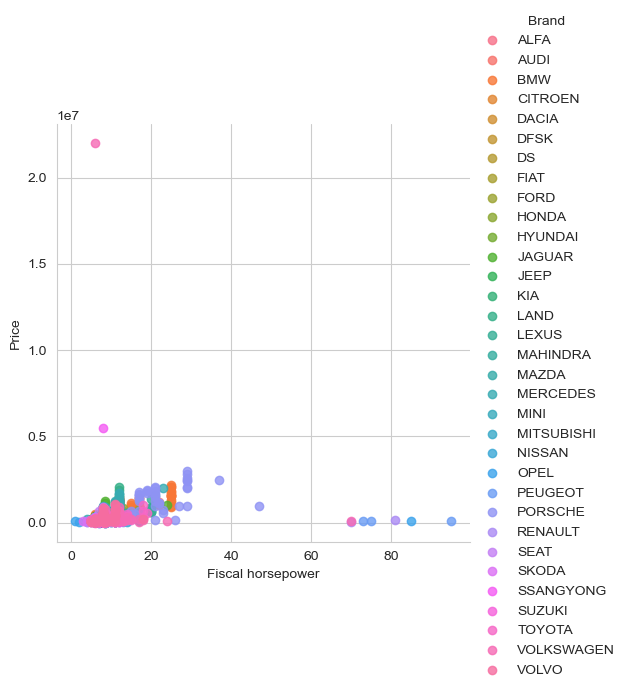

In [106]:
# Create a scatter plot of car prices (Price) versus (Fiscal horsepower) 

vis2= sns.lmplot(data=cars , x="Fiscal horsepower", y="Price", fit_reg=False, hue="Brand", aspect=1)

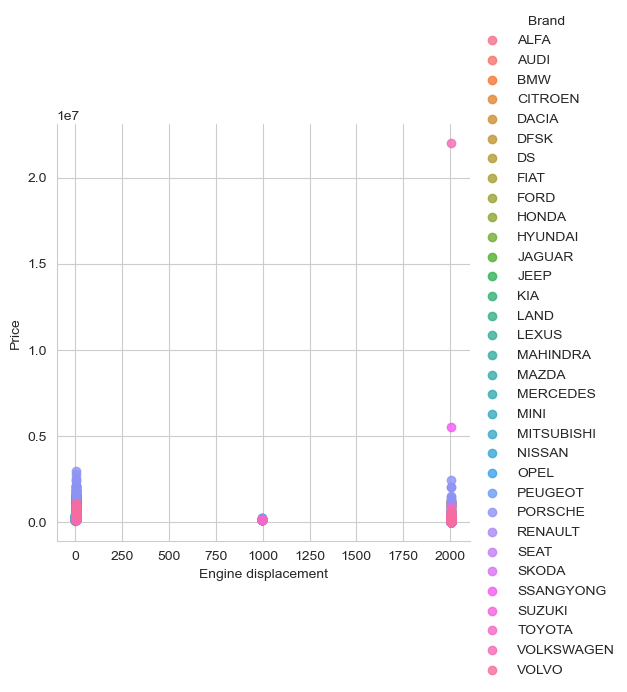

In [107]:
# Create a scatter plot of car prices (Price) versus (Engine displacement) 

vis3= sns.lmplot(data=cars , x="Engine displacement", y="Price", fit_reg=False, hue="Brand", aspect=1)

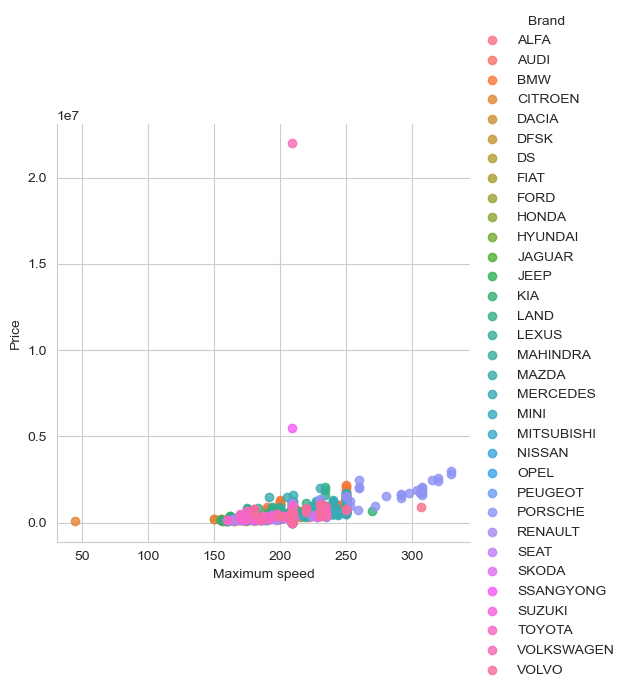

In [108]:
# Create a scatter plot of car prices (Price) versus (Maximum speed) 

vis4= sns.lmplot(data=cars , x="Maximum speed", y="Price", fit_reg=False, hue="Brand", aspect=1)

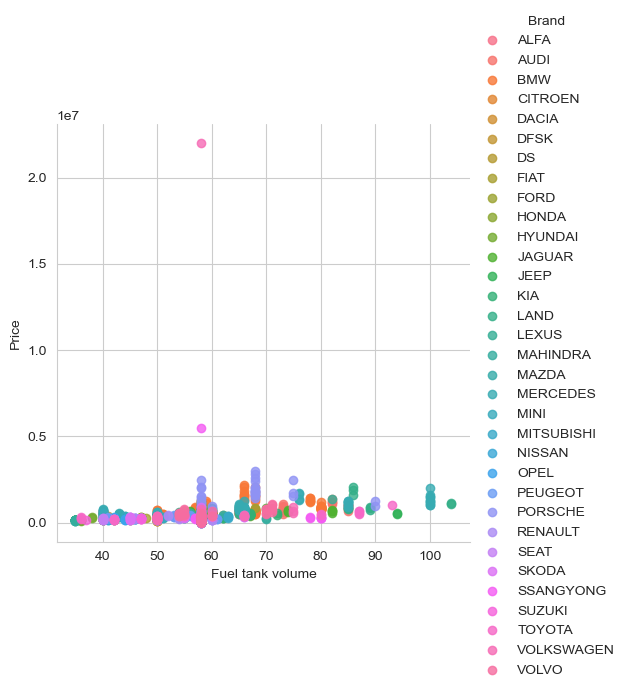

In [109]:
# Create a scatter plot of car prices (Price) versus (Fuel tank volume) 

vis5= sns.lmplot(data=cars , x="Fuel tank volume", y="Price", fit_reg=False, hue="Brand", aspect=1)

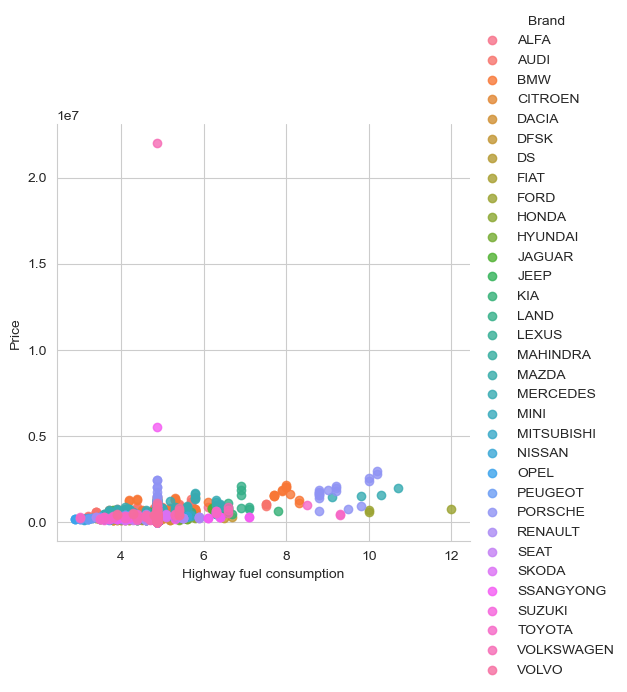

In [110]:
# Create a scatter plot of car prices (Price) versus (Highway fuel consumption) 

vis6= sns.lmplot(data=cars , x="Highway fuel consumption", y="Price", fit_reg=False, hue="Brand", aspect=1)

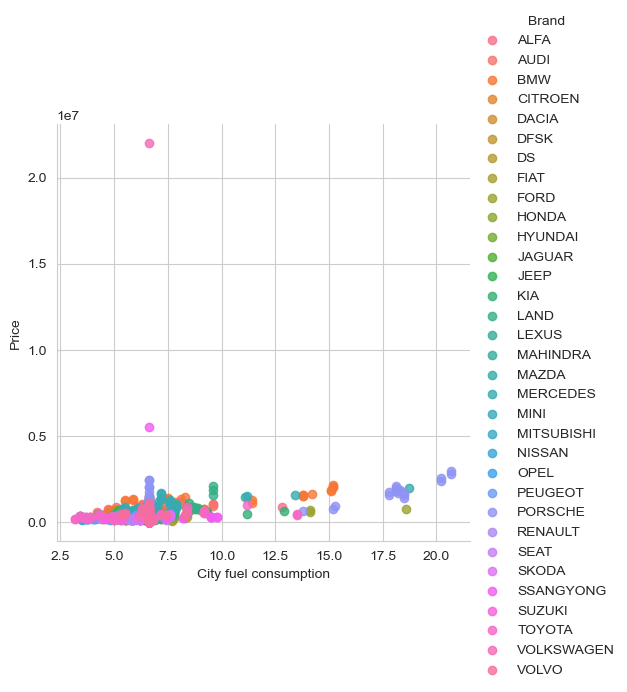

In [111]:
# Create a scatter plot of car prices (Price) versus (City fuel consumption) 

vis7= sns.lmplot(data=cars , x="City fuel consumption", y="Price", fit_reg=False, hue="Brand", aspect=1)

A box plot is a graphical representation of statistical data that shows the distribution of the data and its variability. In this case, the box plot will show the median price, the lower and upper quartiles, and any outliers for each car brand. This can be useful for understanding the range and distribution of prices for different car brands, and for identifying any potential anomalies or trends in the data.

<AxesSubplot:xlabel='Brand', ylabel='Price'>

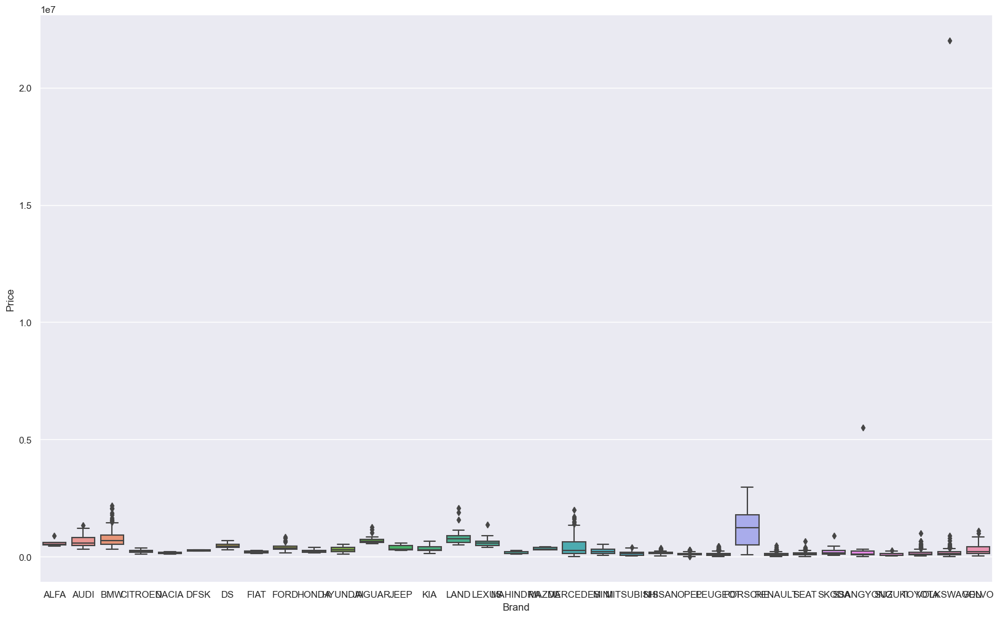

In [112]:
# create a box plot of the relationship between the car brand and its price.
# The x parameter is set to "Brand", which means that the plot will have a separate box for each car brand. 
# The y parameter is set to "Price", which means that the plot will show the distribution of prices for each car brand.
# Show the boxplot
plt.figure(figsize=(20,12))
sns.set(style='darkgrid')
sns.boxplot(x='Brand', y='Price', data=cars)

**We can see that we have many outliers that should be removed:**

In [113]:
# identifiying outliers
def outliers(cars, feature):
    Q1= cars[feature].quantile(0.25)
    Q3 = cars[feature].quantile(0.75)
    IQR = Q3 - Q1
    upper_limit = Q3 + 1.5 * IQR
    lower_limit = Q1 - 1.5 * IQR
    return upper_limit, lower_limit

upper, lower = outliers(cars, "Price")
print("Upper whisker: ", upper)
print("Lower Whisker: ", lower)

Upper whisker:  541500.0
Lower Whisker:  -174500.0


In [114]:
# Removing outliers
cars = cars[(cars['Price'] > lower) & (cars['Price'] < upper)]

<AxesSubplot:xlabel='Price', ylabel='Density'>

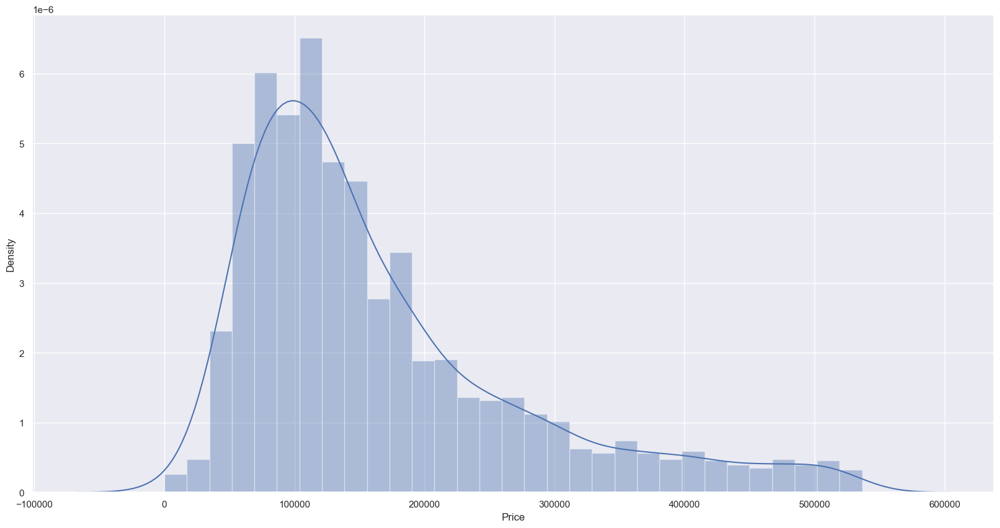

In [115]:
plt.figure(figsize=(20,10))
sns.distplot(cars['Price'])

<AxesSubplot:xlabel='Brand', ylabel='Price'>

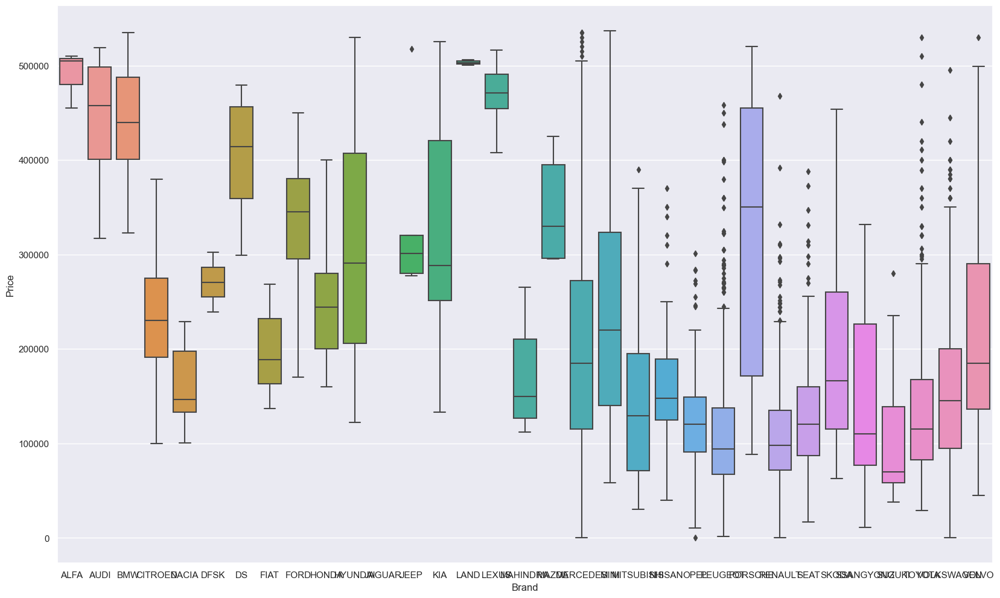

In [116]:
# Show the boxplot
plt.figure(figsize=(20,12))
sns.set(style='darkgrid')
sns.boxplot(x='Brand', y='Price', data=cars)

 **Price variation according to Color:**

<AxesSubplot:xlabel='Exterior color', ylabel='Price'>

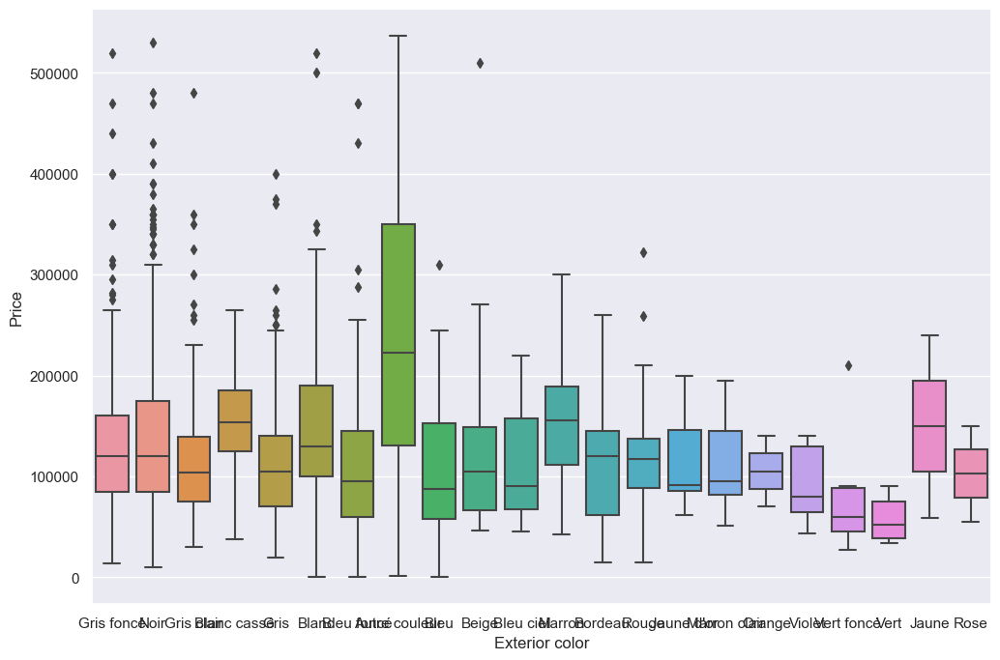

In [117]:
sns.set(style='darkgrid')
plt.figure(figsize=(12,8))
sns.boxplot(x='Exterior color', y='Price', data=cars)

**The color has a great effect on price:**

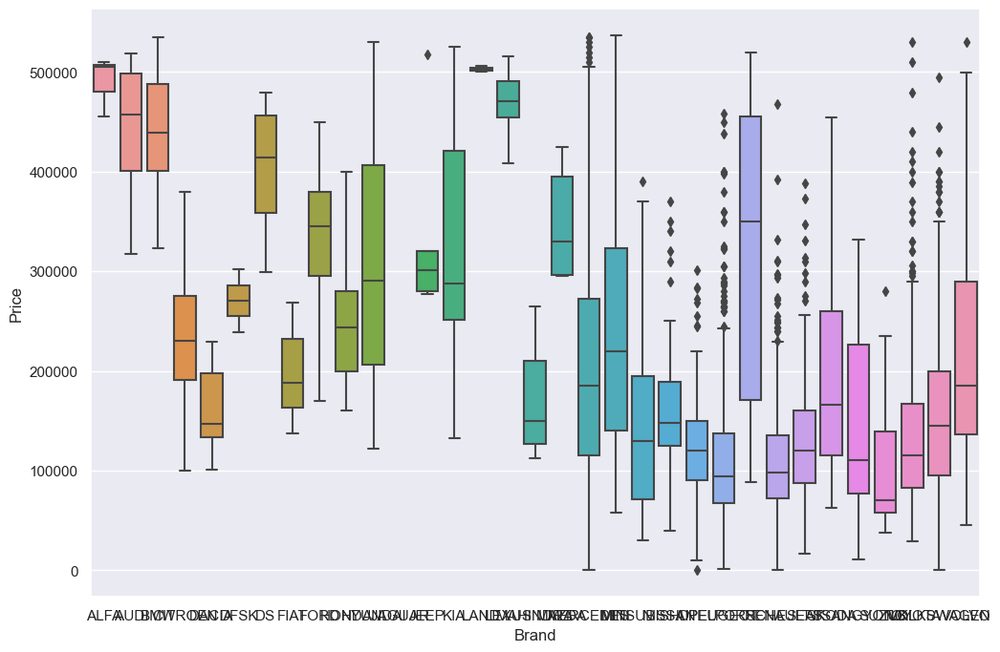

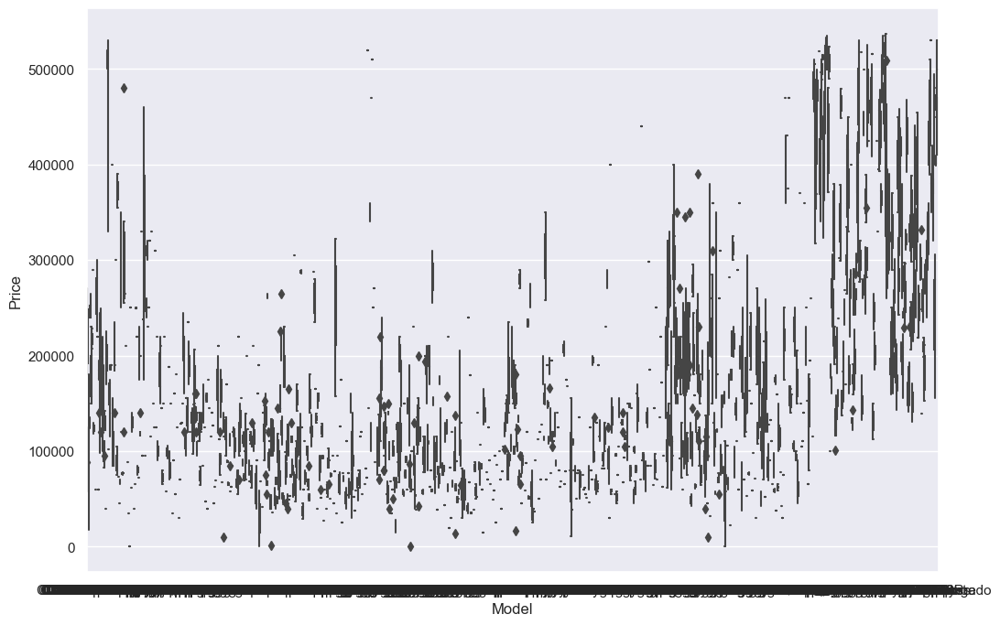

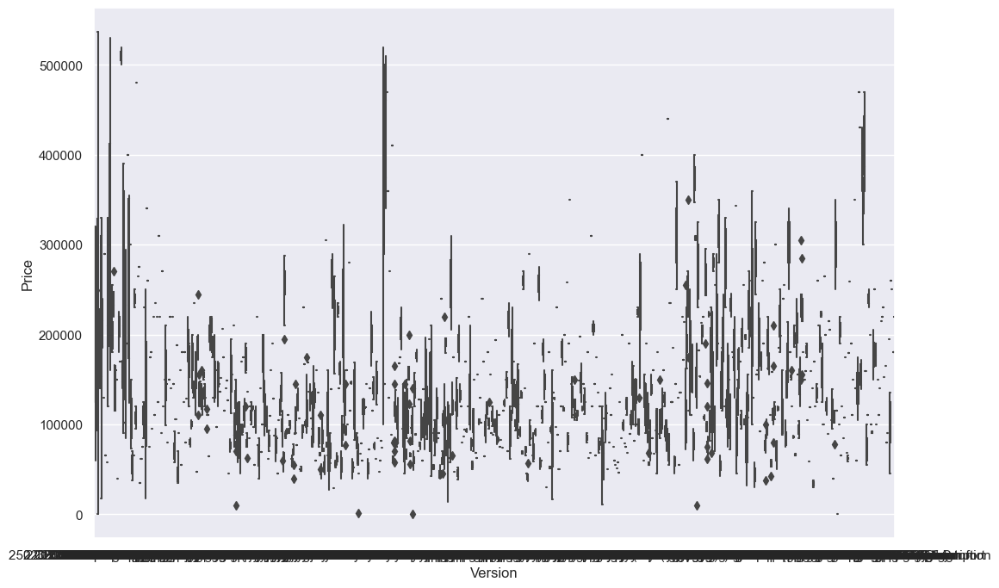

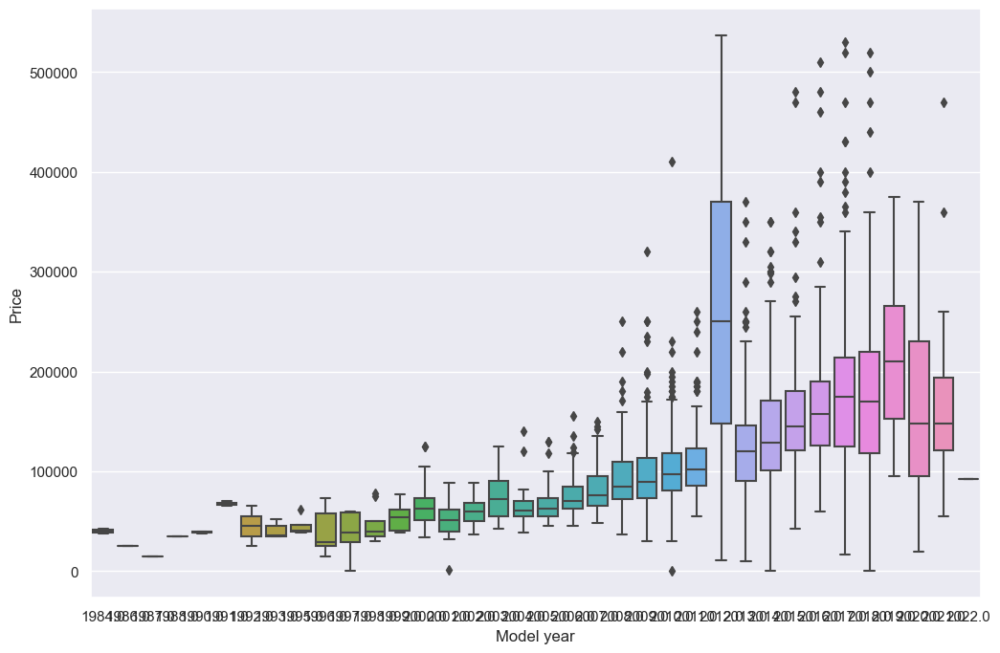

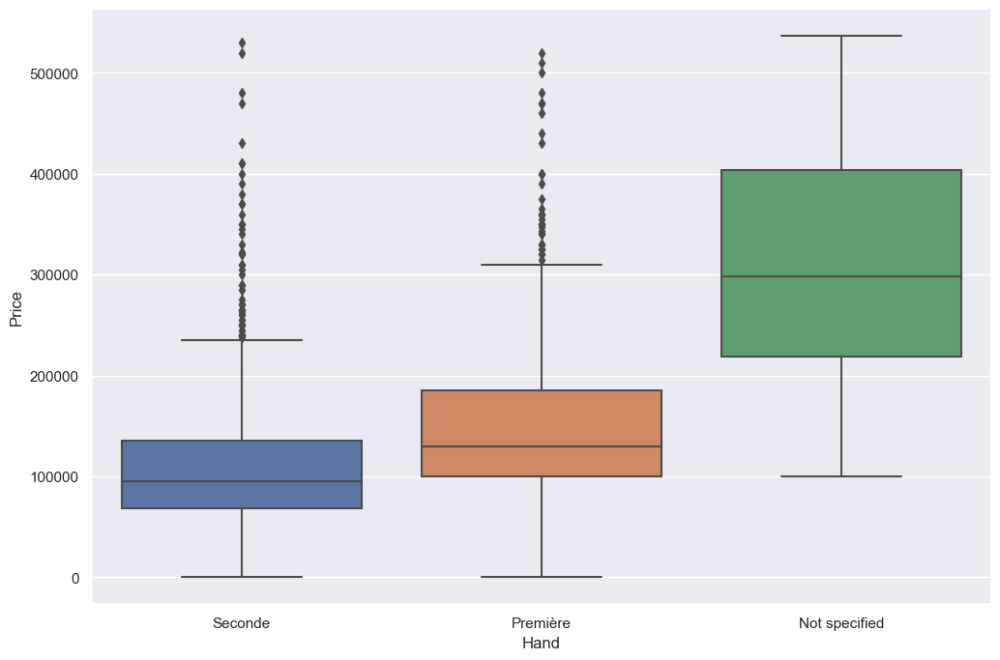

...

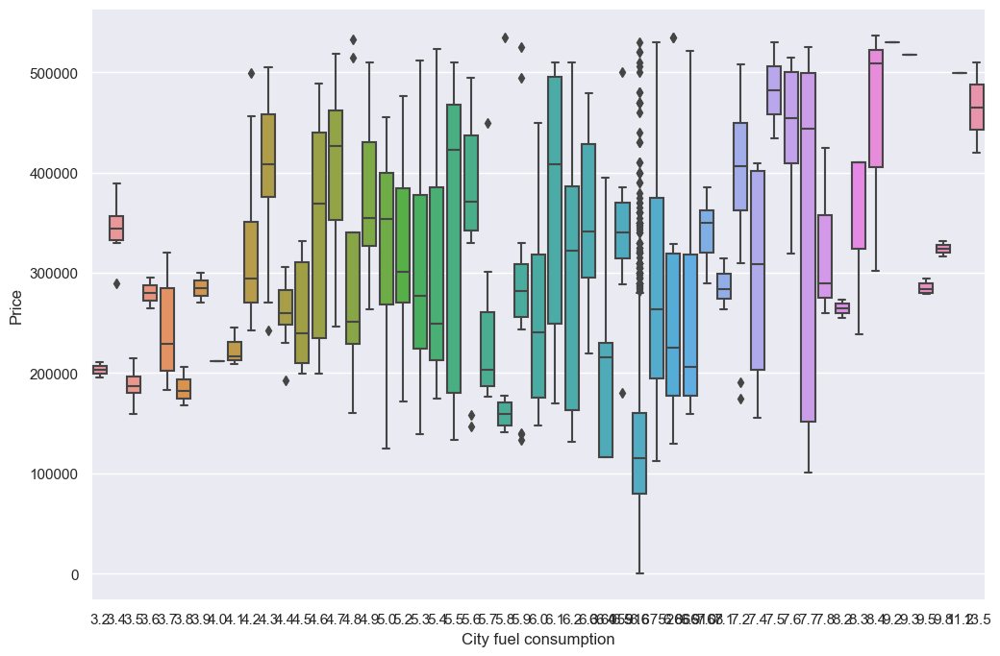

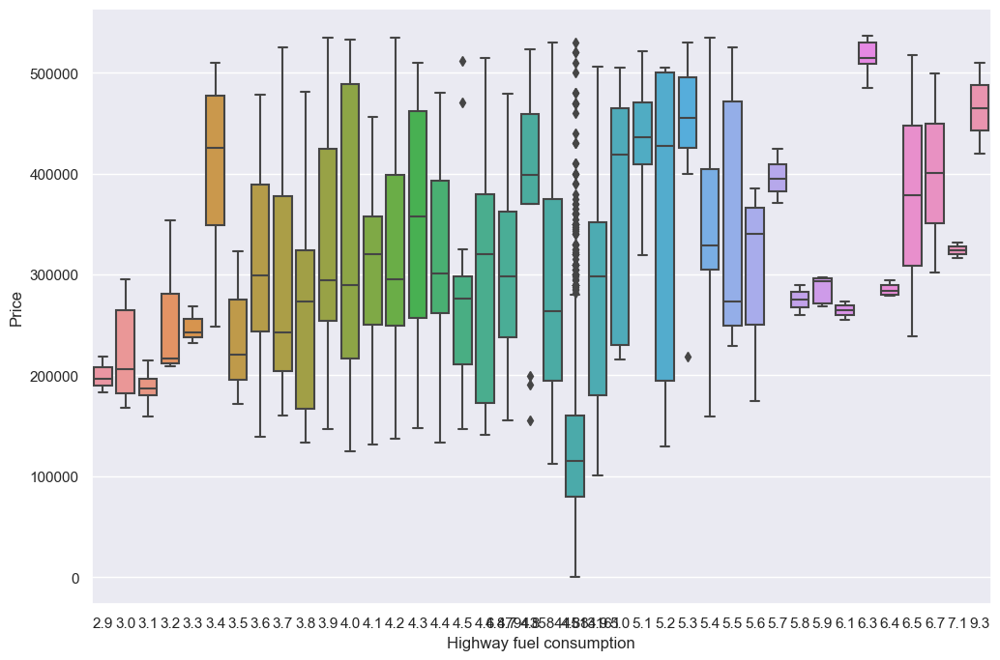

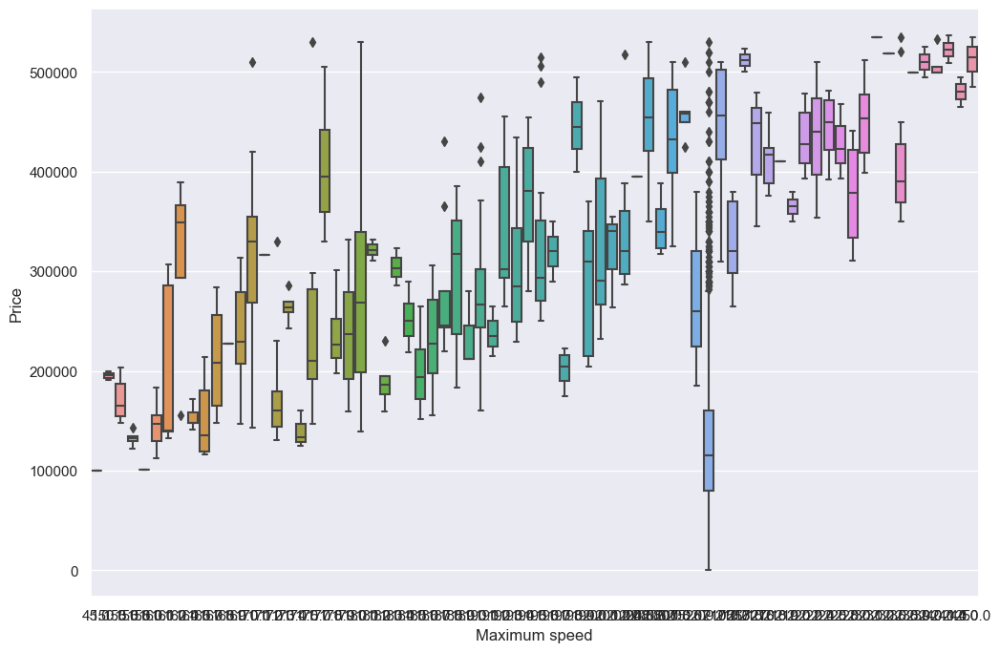

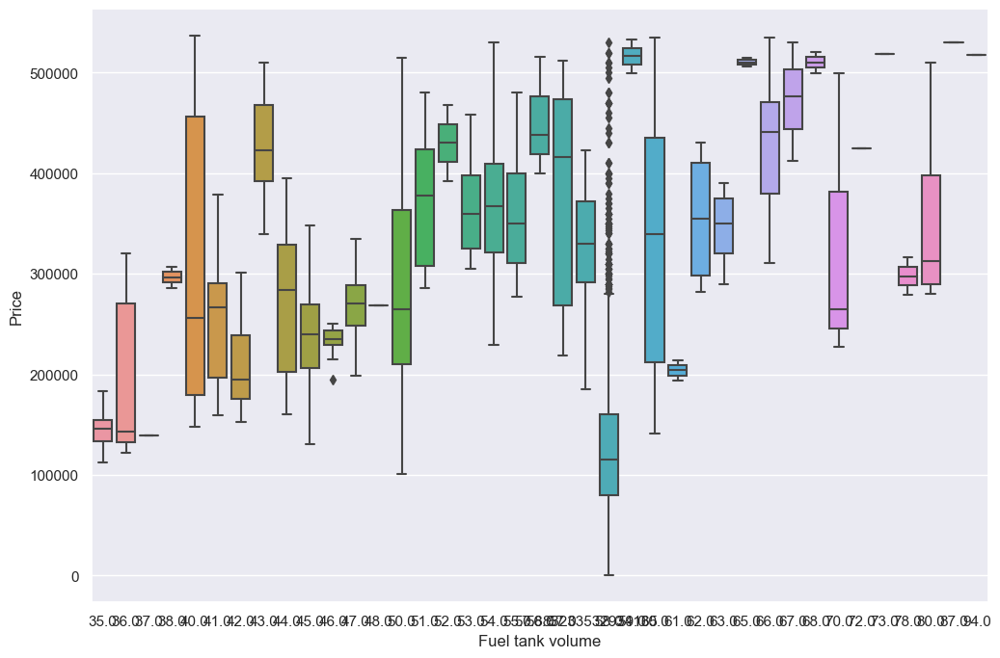

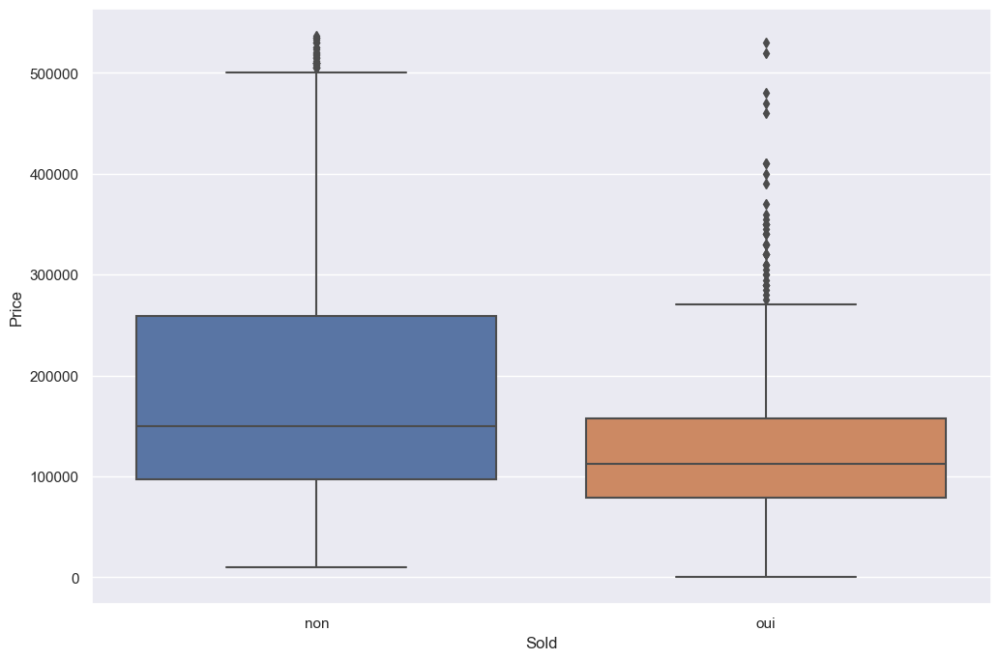

In [118]:
for feature in list(cars.columns):
    if feature!="Price":
        sns.set(style='darkgrid')
        plt.figure(figsize=(12,8))
        sns.boxplot(x=feature, y='Price', data=cars)

## Correlation Matrix

Text(0.5, 1.0, 'Correlation Matrix')

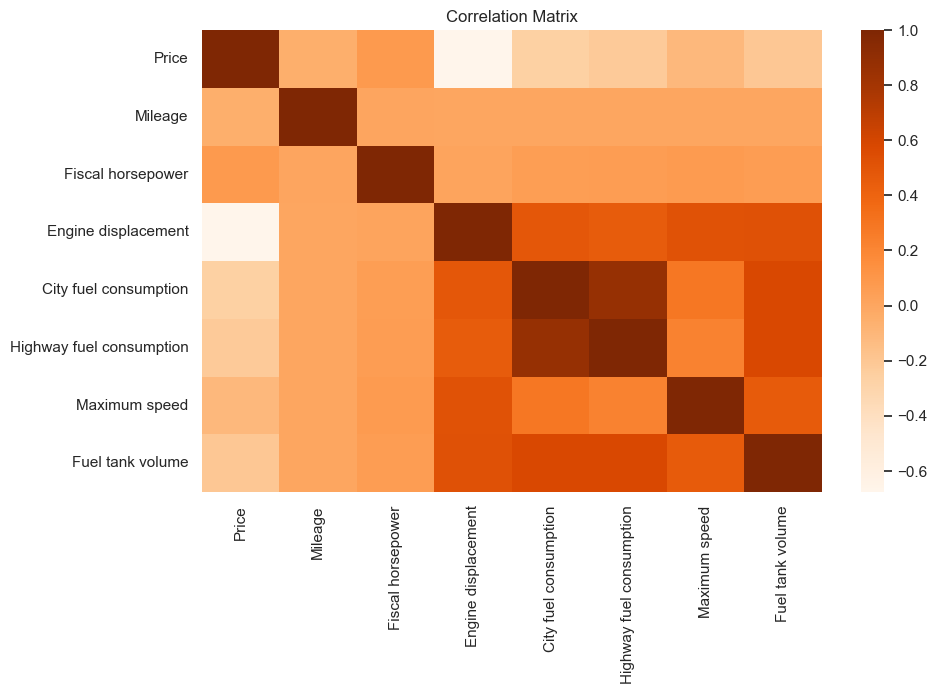

In [119]:
corr = cars.corr()
plt.figure(figsize=(10,6))
sns.heatmap(corr, cmap='Oranges').set_title('Correlation Matrix')

**It seems like there is a significant negative correlation between price and Kilométrage. This is expected because older cars are cheaper.**

**CONCLUSION:** ALL Features influences the price

# Data Preprocessing:

In [120]:
cars.shape

(2669, 44)

In [121]:
# define categorical and numerical features names:
categorical=['Brand', 'Model', 'Version', 'Hand',
       'Fuel type', 'Transmission', 'Exterior color',
       'Vehicle condition', 'Air conditioning', 'Electric windows',
       'Electric seats', 'On-board computer', 'Start & Stop',
       'Cruise control', 'Automatic headlights',
       'Rain sensor', 'Steering wheel controls', 'Touchscreen display',
       'Electric mirrors','Automatic trunk opening', 'Hands-free start',
       '1/3-2/3 folding rear seat', 'Backup camera', 'Bluetooth',
       'Aluminum wheels', 'Leather steering wheel', 'Daytime running lights', 'Roof rails',
       'Roof', 'Airbags', 'ABS', 'ESP', 'Traction control','Engine architecture']
numerical=["Model year","Mileage",'Engine displacement','City fuel consumption',
           'Highway fuel consumption','Maximum speed','Fuel tank volume',"Fiscal horsepower"]

In [122]:
# One Hot Encoding:
dummy_variables = pd.get_dummies(cars[categorical], drop_first=True) #drop_first is set to true to permit dummy encoding
dummy_variables.shape
dummy_variables.head()

Brand_AUDI  Brand_BMW  Brand_CITROEN  Brand_DACIA  Brand_DFSK  Brand_DS  \
0           0          0              0            0           0         0   
1           0          0              0            0           0         0   
2           0          0              0            0           0         0   
3           0          0              0            0           0         0   
4           0          0              0            0           0         0   

   Brand_FIAT  Brand_FORD  Brand_HONDA  Brand_HYUNDAI  Brand_JAGUAR  \
0           0           0            0              0             0   
1           0           0            0              0             0   
2           0           0            0              0             0   
3           0           0            0              0             0   
4           0           0            0              0             0   

   Brand_JEEP  Brand_KIA  Brand_LAND  Brand_LEXUS  Brand_MAHINDRA  \
0           0          0           0            0               0   
1           0          0           0            0               0   
2           0          0           0            0               0   
3           0          0           0            0               0   
4           0          0           0            0               0   

   Brand_MAZDA  Brand_MERCEDES  Brand_MINI  Brand_MITSUBISHI  Brand_NISSAN  \
0            0               1           0                 0             0   
1            0               1           0                 0             0   
2            0               1           0                 0             0   
3            0               1           0                 0             0   
4            0               1           0                 0             0   

   Brand_OPEL  Brand_PEUGEOT  Brand_PORSCHE  Brand_RENAULT  Brand_SEAT  \
0           0              0              0              0           0   
1           0              0              0              0           0   
2           0              0              0              0           0   
3           0              0              0              0           0   
4           0              0              0              0           0   

   Brand_SKODA  Brand_SSANGYONG  Brand_SUZUKI  Brand_TOYOTA  Brand_VOLKSWAGEN  \
0            0                0             0             0                 0   
1            0                0             0             0                 0   
2            0                0             0             0                 0   
3            0                0             0             0                 0   
4            0                0             0             0                 0   

   Brand_VOLVO  Model_107 2010  Model_107 2013  Model_108 2017  \
0            0               0               0               0   
1            0               0               0               0   
2            0               0               0               0   
3            0               0               0               0   
4            0               0               0               0   

   Model_190 1984  Model_190 1988  Model_190 1991  Model_190 1992  \
0               0               0               0               0   
1               0               0               0               0   
2               0               0               0               0   
3               0               0               0               0   
4               0               0               0               0   

   Model_190 1993  Model_190 2001  Model_190 2013  Model_2008  \
0               0               0               0           0   
1               0               0               0           0   
2               0               0               0           0   
3               0               0               0           0   
4               0               0               0           0   

   Model_2008 2014  Model_2008 2015  Model_2008 2016  Model_2008 2017  \
0              

In [123]:
# Normalization
#Import the MinMaxScaler() function
from sklearn.preprocessing import MinMaxScaler
num_features = cars[["Model year","Mileage",'Engine displacement','City fuel consumption',
           'Highway fuel consumption','Maximum speed','Fuel tank volume',"Fiscal horsepower","Price"]]
sc = MinMaxScaler()
#num_features = sc.fit_transform(num_features)

In [124]:
# combining categorical and numerical features
cat_features = dummy_variables.values

preprocessed_data = np.concatenate((cat_features, num_features), axis=1)
X = preprocessed_data[:, :preprocessed_data.shape[1]-1]
y = preprocessed_data[:, preprocessed_data.shape[1]-1]
preprocessed_data.shape
#dummy_variables.describe

(2669, 1918)

In [125]:
# Spliting DATA:
from sklearn.model_selection import train_test_split

#we willuse 20% of data to test and 80% to train
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state=42) #Popular integer random seeds are 0 and 42.

# Model Training

### Model 1 : Linear Regression :

In [126]:
from sklearn.linear_model import LinearRegression
# Splitting the data into training and testing data
regr = LinearRegression()
regr.fit(X_train, y_train)
y_predicted=regr.predict(X_test)

In [127]:
r2_score = regr.score(X_test,y_test)
print(r2_score*100,'%')

-1133372625766.3813 %


In [128]:
from sklearn.metrics import accuracy_score, confusion_matrix, f1_score, precision_score, recall_score
import math
print(accuracy_score(y_test, y_predicted))
print(recall(y_test, y_predicted))

ValueError: Classification metrics can't handle a mix of multiclass and continuous targets

### Model 2 : Gradient Boosting Regressor model :

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor

#Create a GradientBoostingRegressor object
params = {'n_estimators': 600, 'max_depth': 5,
'learning_rate': 0.03, 'loss': 'ls'}
gbr = GradientBoostingRegressor(**params)

#Train the model
gbr.fit(X_train, y_train)

#Evaluate the model
print('R-squared score (training): {:.3f}'
.format(gbr.score(X_train, y_train)))
print('R-squared score (test): {:.3f}'
.format(gbr.score(X_test, y_test)))

In [129]:
r2_score = gbr.score(X_test,y_test)
print(r2_score*100,'%')

NameError: name 'gbr' is not defined